In [ ]:
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
import torchvision
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import torch.nn.functional as F
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
import pandas as pd
from torchvision import models
import seaborn as sns

## 1. Классификация предметов одежды (датасет Fashion MNIST)



### 1.1 Решить задачу классификации, не используя сверточные слои.
* Предложить архитектуру модели для решения задачи
* Посчитать количество параметров модели.
* Обучить модель
* Вывести график функции потерь по эпохам.
* Используя тестовое множество

  * Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

  * Вывести матрицу ошибок.

  * Вывести значение accuracy на тестовом множестве.
* Сохранить модель

In [ ]:
train_dataset = torchvision.datasets.FashionMNIST(root='./data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)

test_dataset = torchvision.datasets.FashionMNIST(root='./data',
                                          train=False,
                                          transform=transforms.ToTensor(),
                                          download=True)

train_dl = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=100,
                                           shuffle=True)

test_dl = torch.utils.data.DataLoader(dataset=test_dataset,
                                          batch_size=100,
                                          shuffle=False)

100%|██████████| 26421880/26421880 [00:02<00:00, 12602603.48it/s]


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 201252.24it/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 3711153.51it/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 22375416.57it/s]


Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



In [ ]:
print(train_dl.dataset)
print(test_dl.dataset)

Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: ./data
    Split: Train
    StandardTransform
Transform: ToTensor()
Dataset FashionMNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()


In [ ]:
num_classes = len(train_dataset.classes)
print("Количество классов в датасете:", num_classes)
input_size = train_dataset[0][0].size()
print("Размер входных данных:", input_size)

Количество классов в датасете: 10
Размер входных данных: torch.Size([1, 28, 28])


In [ ]:
num_classes = 10
input_size = 1 * 28 * 28
hidden_size = 256
num_epochs = 10
learning_rate = 0.001

Предложить архитектуру модели для решения задачи

In [ ]:
model = nn.Sequential(
    nn.Linear(input_size, hidden_size * 4),
    nn.ReLU(),
    nn.Linear(hidden_size * 4, hidden_size),
    nn.Linear(hidden_size, hidden_size * 3),
    nn.Linear(hidden_size * 3, num_classes))

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Посчитать количество параметров модели.

In [ ]:
param_num = sum(p.numel() for p in model.parameters())
print("Количество параметров:", param_num)

Количество параметров: 1271306


In [ ]:
 for (inputs, targets) in train_dl:
          shape=[-1,28*28]
          inputs, targets = inputs, targets
          print(inputs.shape)
          inputs = inputs.reshape(shape[0], shape[1])
          print(inputs.shape)
          outputs = model(inputs)
          # print(outputs)
          # _, prediction_indices = torch.max(outputs, 1)
          # print(prediction_indices)
          break

torch.Size([100, 1, 28, 28])
torch.Size([100, 784])


In [ ]:
def train(model, train_dl, optimizer, criterion, squeeze_inputs = False, shape=[-1,28*28]):
    model.train()

    total_loss = 0.0
    total_samples = 0.0
    correct_samples = 0.0

    for (inputs, targets) in train_dl:
        inputs, targets = inputs, targets
        if squeeze_inputs:
            inputs = inputs.reshape(shape[0], shape[1])

        outputs = model(inputs)
        loss = criterion(outputs, targets.squeeze())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss

        total_samples += targets.shape[0]

        _, prediction_indices = torch.max(outputs, 1)
        correct_samples += torch.sum(prediction_indices==targets)

    train_accuracy = float(correct_samples) / total_samples

    return total_loss, train_accuracy

In [ ]:
def test(model, test_dl, squeeze_inputs = False):
    model.eval()

    total_samples = 0.0
    correct_samples = 0.0

    with torch.no_grad():
      for inputs, targets in test_dl:
          inputs, targets = inputs, targets
          if squeeze_inputs:
              inputs = inputs.reshape(-1, 28*28)

          outputs = model(inputs)

          total_samples += targets.shape[0]
          _, predictions_indices = torch.max(outputs, 1)
          correct_samples += torch.sum(predictions_indices==targets)

    test_accuracy = correct_samples / total_samples

    return test_accuracy

Обучить модель

In [ ]:
losses = []
for epoch in range(num_epochs):
    total_loss, train_accuracy = train(model, train_dl, optimizer, criterion, squeeze_inputs=True)
    losses.append(total_loss.item())
    test_accuracy = test(model, test_dl, squeeze_inputs=True)

    print(f"epoch - {epoch+1} ; Loss: {total_loss:.4f} ; Train_acc: {train_accuracy:.4f} ;"
         f" Test_acc: {test_accuracy:.4f}")

epoch - 1 ; Loss: 298.5394 ; Train_acc: 0.8199 ; Test_acc: 0.8429
epoch - 2 ; Loss: 227.7682 ; Train_acc: 0.8628 ; Test_acc: 0.8619
epoch - 3 ; Loss: 204.4042 ; Train_acc: 0.8754 ; Test_acc: 0.8613
epoch - 4 ; Loss: 191.0088 ; Train_acc: 0.8847 ; Test_acc: 0.8666
epoch - 5 ; Loss: 181.0665 ; Train_acc: 0.8897 ; Test_acc: 0.8714
epoch - 6 ; Loss: 171.9912 ; Train_acc: 0.8937 ; Test_acc: 0.8766
epoch - 7 ; Loss: 168.0450 ; Train_acc: 0.8967 ; Test_acc: 0.8821
epoch - 8 ; Loss: 158.7096 ; Train_acc: 0.9020 ; Test_acc: 0.8809
epoch - 9 ; Loss: 151.6665 ; Train_acc: 0.9056 ; Test_acc: 0.8771
epoch - 10 ; Loss: 145.3988 ; Train_acc: 0.9100 ; Test_acc: 0.8848


Вывести график функции потерь по эпохам

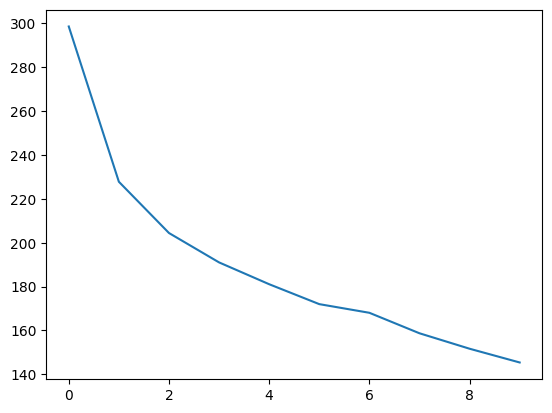

In [ ]:
plt.plot(losses);

Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

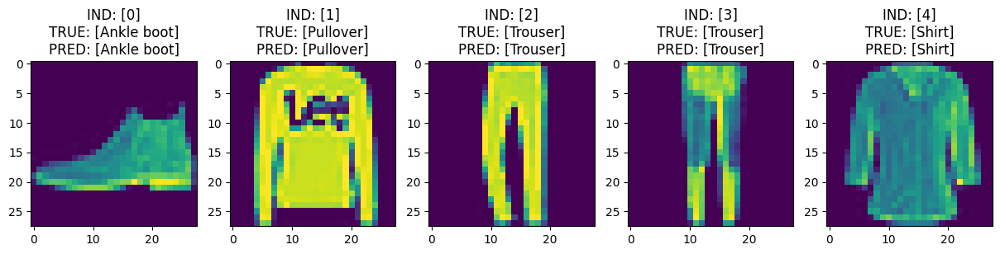

In [ ]:
model.eval()
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets
        inputs = inputs.reshape(-1, 28*28)

        outputs = model(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        fig, axs = plt.subplots(1, 5, figsize=(15, 3))

        for i, (inpt, trgt, pred) in enumerate(zip(inputs, targets, predictions_indices)):
            ax = axs[i % 5]
            ax.set_title(f"IND: [{i}]\nTRUE: [{class_names[trgt]}]\nPRED: [{class_names[pred]}]")
            ax.imshow(inpt.view(28, 28))

            if i % 5 == 4:
                plt.show()
                if i == 9:
                    break
        break

In [ ]:
model.eval()

true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets
        inputs = inputs.reshape(-1, 28*28)

        outputs = model(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))
print(predict)
print(true)

tensor([9., 2., 1.,  ..., 8., 1., 5.])
tensor([9., 2., 1.,  ..., 8., 1., 5.])


Вывести матрицу ошибок

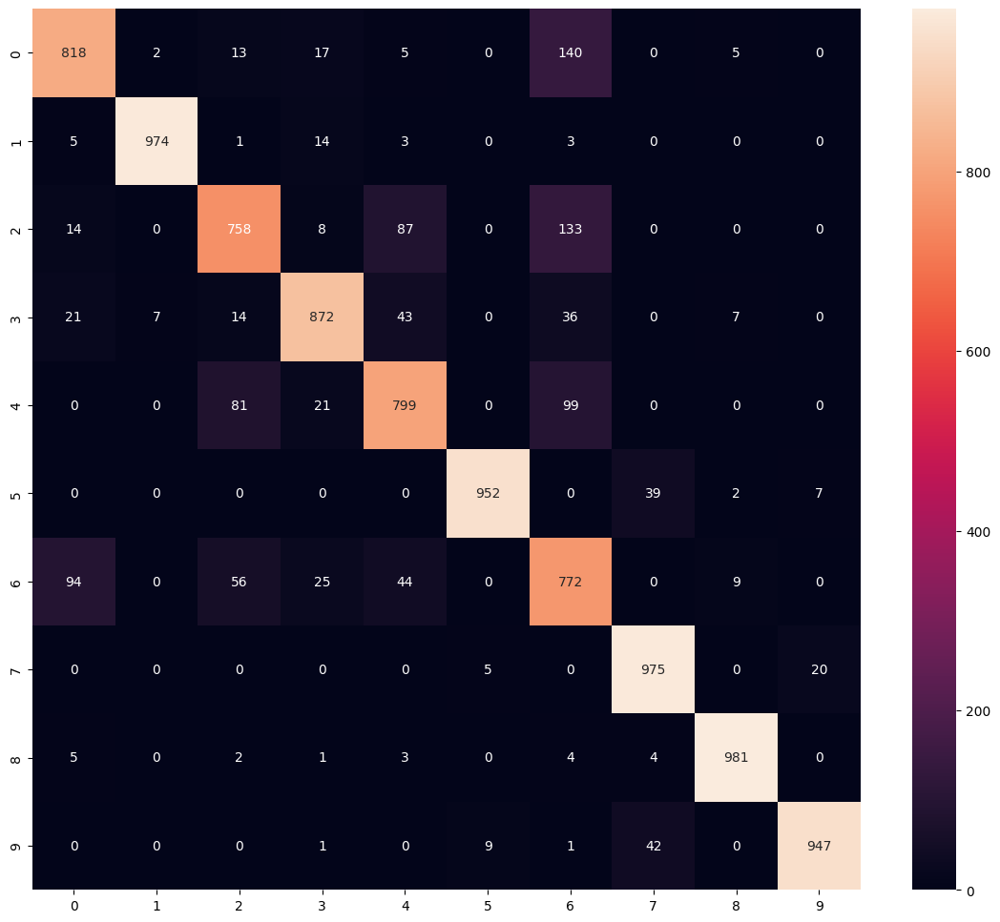

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

Вывести значение accuracy на тестовом множестве.

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.8848


Сохранить модель

In [ ]:
torch.save(model.state_dict(), 'model_Fashion_MNIST_paramonov.pth')

### 1.2 Решить задачу 1.1, используя сверточную нейронную сеть.
* Добиться значения accuracy на тестовом множестве не менее 90%
* Визуализировать результаты работы первого сверточного слоя

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(576, 256),
            nn.Dropout(p=0.5),
            nn.Linear(256, 10)
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

    def forward_1l(self, x):
        x = self.conv1(x)
        return x

In [ ]:
learning_rate = 0.001
num_epochs = 10
model = Net()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss()

In [ ]:
def count_weights_and_biases(model):
    total_weights = 0
    total_biases = 0

    for name, param in model.named_parameters():
        if 'weight' in name:
            total_weights += param.numel()
        elif 'bias' in name:
            total_biases += param.numel()

    return total_weights, total_biases

total_weights, total_biases = count_weights_and_biases(model)
print("Количество весов:", total_weights)
print("Количество смещений:", total_biases)

Количество весов: 173312
Количество смещений: 490


In [ ]:
param_num = sum(p.numel() for p in model.parameters())
print("Количество параметров:", param_num)

Количество параметров: 173802


Добиться значения accuracy на тестовом множестве не менее 90%

In [ ]:
losses = []
for epoch in range(num_epochs):
    total_loss, train_accuracy = train(model, train_dl, optimizer, criterion, squeeze_inputs=False)
    losses.append(total_loss.item())
    test_accuracy = test(model, test_dl, squeeze_inputs=False)
    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}]")

epoch [1]: Loss: [259.3548], Train_acc: [0.8448], Test_acc: [0.8797]
epoch [2]: Loss: [179.8369], Train_acc: [0.8911], Test_acc: [0.8954]
epoch [3]: Loss: [157.0284], Train_acc: [0.9061], Test_acc: [0.8970]
epoch [4]: Loss: [142.1512], Train_acc: [0.9142], Test_acc: [0.9066]
epoch [5]: Loss: [131.3190], Train_acc: [0.9213], Test_acc: [0.8989]
epoch [6]: Loss: [122.7575], Train_acc: [0.9249], Test_acc: [0.9063]
epoch [7]: Loss: [114.2812], Train_acc: [0.9315], Test_acc: [0.9007]
epoch [8]: Loss: [107.0656], Train_acc: [0.9351], Test_acc: [0.9075]
epoch [9]: Loss: [101.8825], Train_acc: [0.9382], Test_acc: [0.9027]
epoch [10]: Loss: [98.4094], Train_acc: [0.9403], Test_acc: [0.9080]


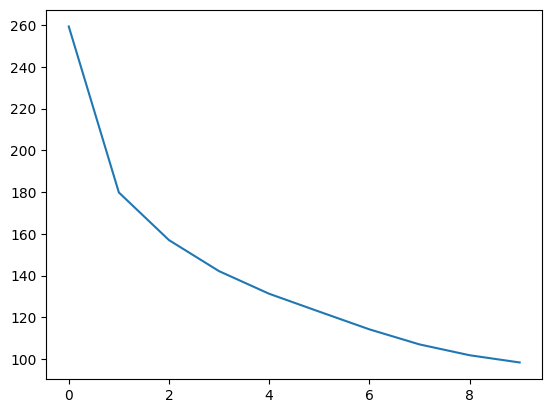

In [ ]:
plt.plot(losses);

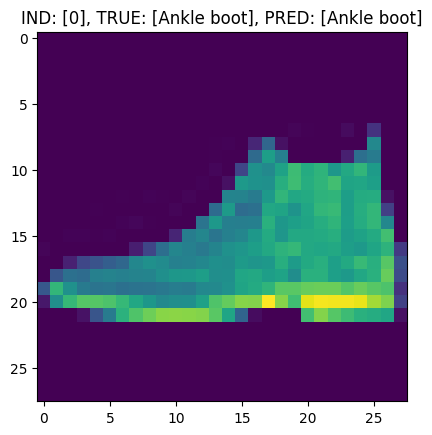

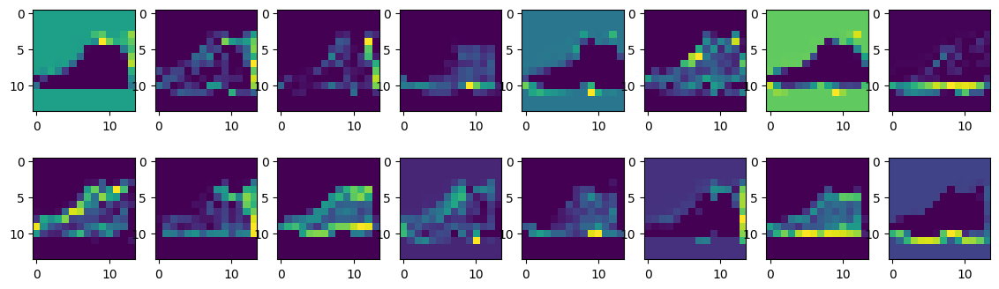

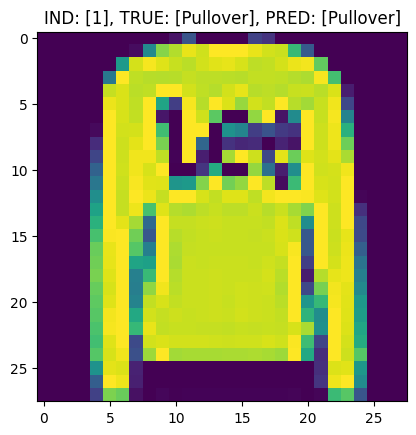

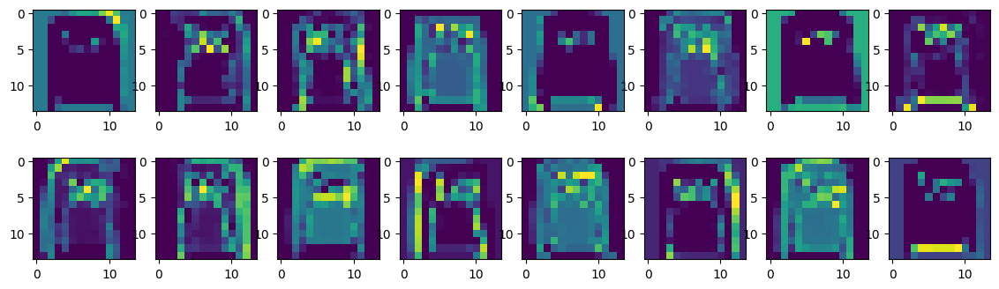

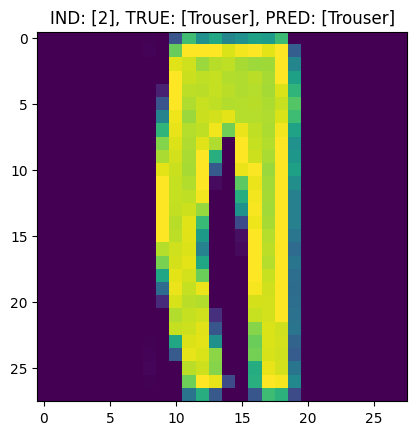

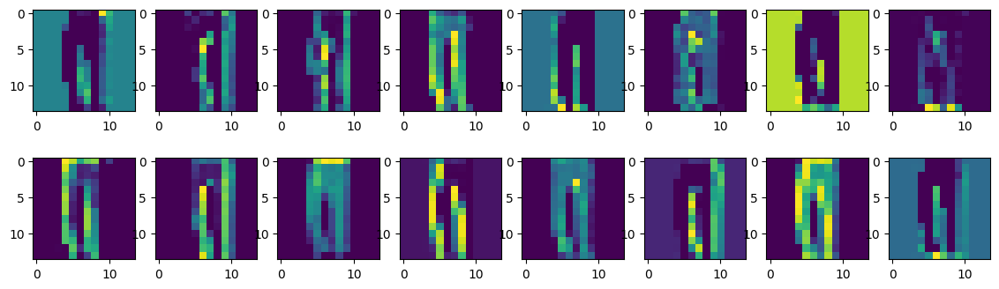

In [ ]:
model.eval()
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets

        outputs = model.forward(inputs)
        outputs_1l = model.forward_1l(inputs)
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{class_names[trgt]}], PRED: [{class_names[pred]}]")
            plt.imshow(inpt.view(28, 28))
            fig, ax = plt.subplots(2,8, figsize=(14, 4))

            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j])
                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
model.eval()

true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets
        outputs = model(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))
print(true)
print(predict)

tensor([9., 2., 1.,  ..., 8., 1., 5.])
tensor([9., 2., 1.,  ..., 8., 1., 5.])


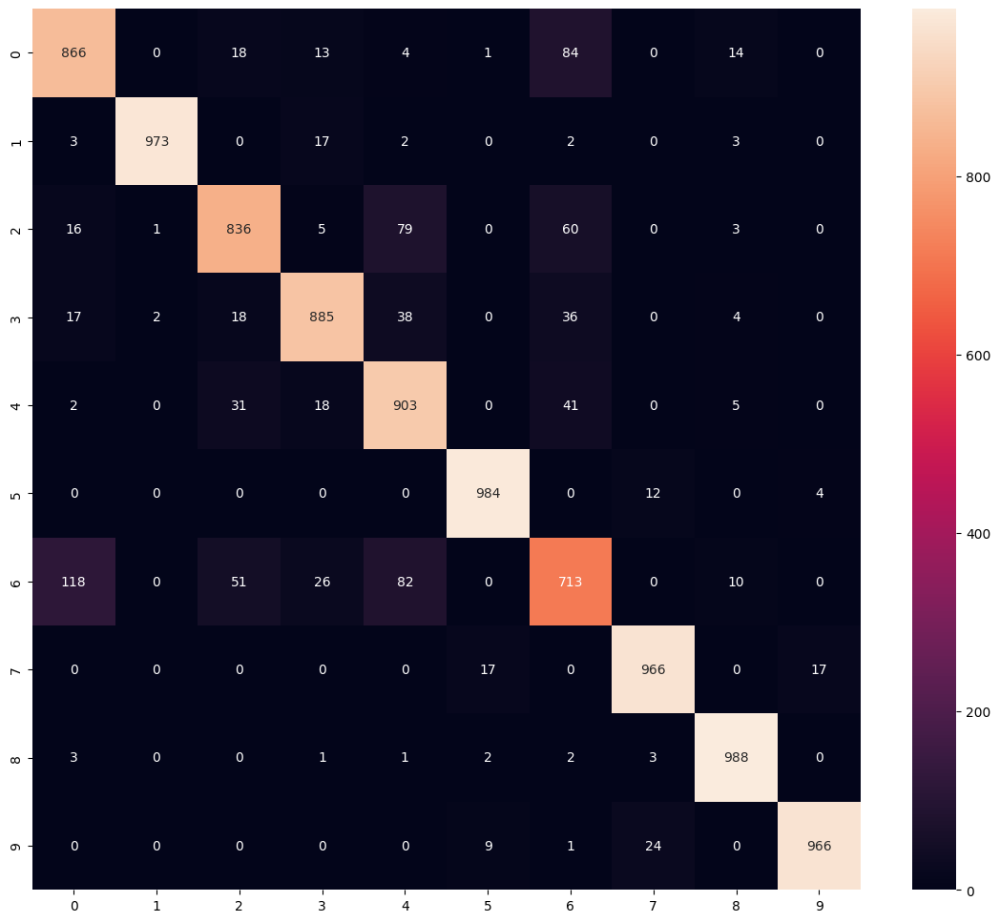

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.9080


In [ ]:
test(model, test_dl)

tensor(0.9080)

In [ ]:
torch.save(model.state_dict(), 'model_Fashion_MNIST_cnn_paramonov.pth')

##  2. Классификация изображений (датасет CIFAR 10)


### 2.1 Решить задачу классификации, не используя сверточные слои.

* Нормализовать данные (если необходимо)
* Предложить архитектуру модели для решения задачи
* Посчитать количество параметров модели.
* Обучить модель
* Вывести график функции потерь по эпохам.
* Используя тестовое множество

  * Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

  * Вывести матрицу ошибок.

  * Вывести значение accuracy на тестовом множестве.
* Сохранить модель

In [ ]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

batch_size = 100

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)

train_dl = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)

test_dl = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

100%|██████████| 170498071/170498071 [00:05<00:00, 33026618.25it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


In [ ]:
num_classes = len(trainset.classes)
print("Количество классов в датасете:", num_classes)
input_size = trainset[0][0].size()
print("Входной размер:", input_size)

Количество классов в датасете: 10
Входной размер: torch.Size([3, 32, 32])


In [ ]:
trainset.classes

['airplane',
 'automobile',
 'bird',
 'cat',
 'deer',
 'dog',
 'frog',
 'horse',
 'ship',
 'truck']

In [ ]:
num_classes = 10
input_size = 3 * 32 * 32
hidden_size = 256
num_epochs = 10
learning_rate = 0.001

In [ ]:
class CIFARNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(input_size, hidden_size * 4)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size * 4, hidden_size)
        self.fc3 = nn.Linear(hidden_size, hidden_size * 3)
        self.fc4 = nn.Linear(hidden_size * 3, num_classes)


    def forward(self, x):
        x = x.view(batch_size, -1)
        x = self.fc4(self.fc3(self.fc2(self.relu(self.fc1(x)))))
        return x

model = CIFARNet()
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
total_weights, total_biases = count_weights_and_biases(model)
print("Количество весов:", total_weights)
print("Количество смещений:", total_biases)

Количество весов: 3612160
Количество смещений: 2058


In [ ]:
param_num = sum(p.numel() for p in model.parameters())
print("Количество параметров:", param_num)

Количество параметров: 3614218


In [ ]:
losses = []
for epoch in range(num_epochs):
    total_loss, train_accuracy = train(model, train_dl, optimizer, criterion, shape=[-1,32*32])
    losses.append(total_loss.item())
    test_accuracy = test(model, test_dl, squeeze_inputs=False)

    print(f"epoch - {epoch+1} ; Loss: {total_loss:.4f} ; Train_acc: {train_accuracy:.4f} ;"
         f" Test_acc: {test_accuracy:.4f}")

epoch - 1 ; Loss: 848.7240 ; Train_acc: 0.3977 ; Test_acc: 0.4621
epoch - 2 ; Loss: 748.9478 ; Train_acc: 0.4720 ; Test_acc: 0.4768
epoch - 3 ; Loss: 700.1777 ; Train_acc: 0.5125 ; Test_acc: 0.5001
epoch - 4 ; Loss: 659.6472 ; Train_acc: 0.5405 ; Test_acc: 0.4912
epoch - 5 ; Loss: 623.4747 ; Train_acc: 0.5661 ; Test_acc: 0.5115
epoch - 6 ; Loss: 590.1074 ; Train_acc: 0.5906 ; Test_acc: 0.5074
epoch - 7 ; Loss: 561.4932 ; Train_acc: 0.6104 ; Test_acc: 0.5348
epoch - 8 ; Loss: 531.8898 ; Train_acc: 0.6323 ; Test_acc: 0.5297
epoch - 9 ; Loss: 508.6466 ; Train_acc: 0.6485 ; Test_acc: 0.5280
epoch - 10 ; Loss: 479.3391 ; Train_acc: 0.6711 ; Test_acc: 0.5266


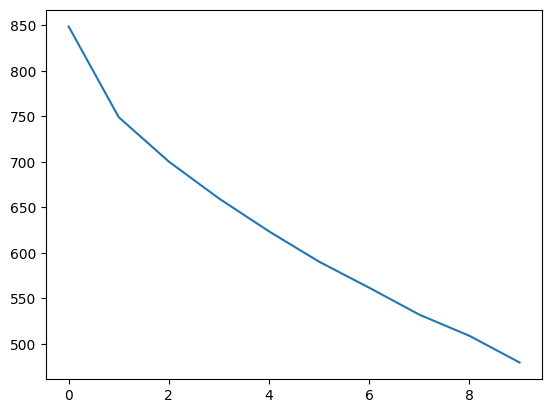

In [ ]:
plt.plot(losses);

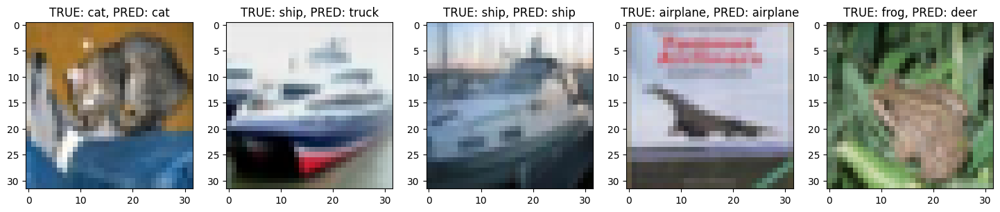

In [ ]:
model.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets

        outputs = model(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        plt.figure(figsize=(18, 4))

        for i, (inpt, trgt, pred) in enumerate(zip(inputs, targets, predictions_indices)):
            plt.subplot(1, 5, i + 1)
            plt.title(f"TRUE: {trainset.classes[trgt]}, PRED: {trainset.classes[pred]}")
            inpt = (inpt / 2 + 0.5).numpy()
            inpt = np.transpose(inpt, (1, 2, 0))
            plt.imshow(inpt)

            if i == 4:
                break

        plt.show()

        break


In [ ]:
model.eval()

true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets
        inputs = inputs.reshape(-1, 32*32)

        outputs = model(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))


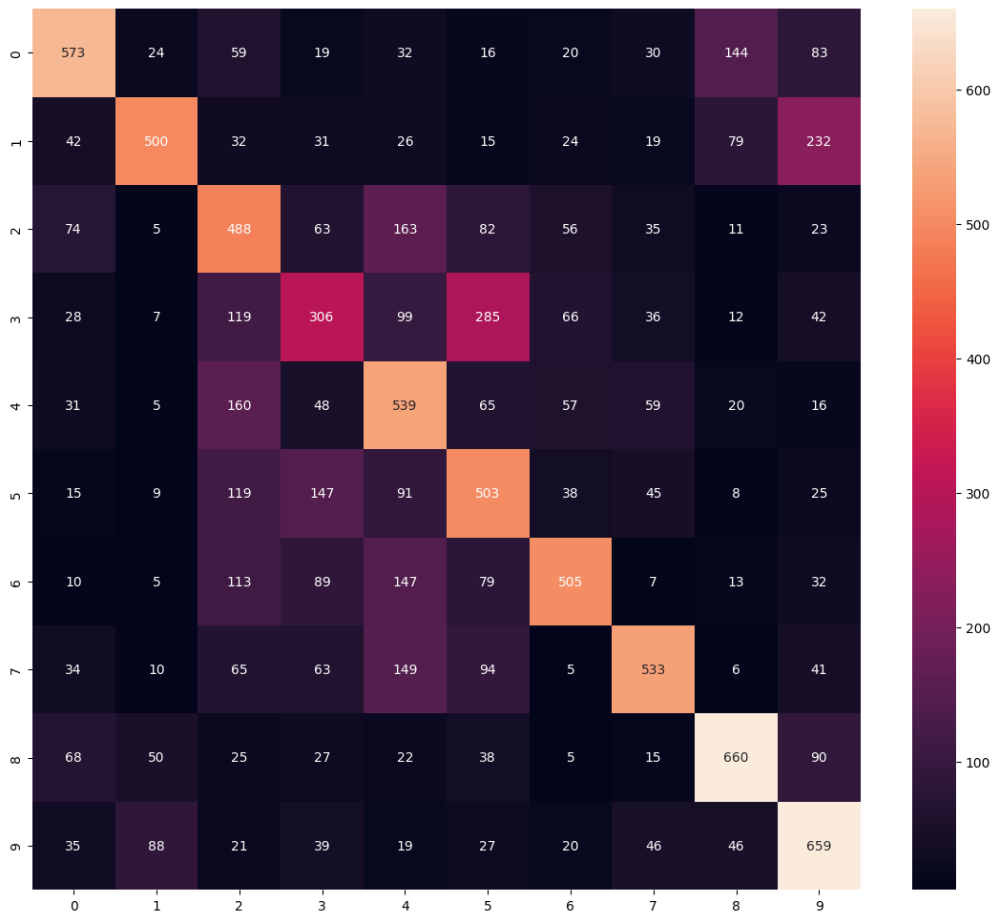

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.5266


In [ ]:
torch.save(model.state_dict(), 'model_CIFAR_paramonov.pth')

### 2.2 Решить задачу 2.1, используя сверточную нейронную сеть.
* Добиться значения accuracy на тестовом множестве не менее 70%.
* Визуализировать результаты работы первого сверточного слоя

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(1024, 256),
            nn.Dropout(p=0.5),
            nn.Linear(256, 10)
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

    def forward_1l(self, x):
        x = self.conv1(x)
        return x

In [ ]:
learning_rate = 0.001
num_epochs = 10
model = Net()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss()

In [ ]:
def count_weights_and_biases(model):
    total_weights = 0
    total_biases = 0

    for name, param in model.named_parameters():
        if 'weight' in name:
            total_weights += param.numel()
        elif 'bias' in name:
            total_biases += param.numel()

    return total_weights, total_biases

total_weights, total_biases = count_weights_and_biases(model)
print("Количество весов:", total_weights)
print("Количество смещений:", total_biases)

Количество весов: 288288
Количество смещений: 490


In [ ]:
losses = []
for epoch in range(num_epochs):
    total_loss, train_accuracy = train(model, train_dl, optimizer, criterion, squeeze_inputs=False)
    losses.append(total_loss.item())
    test_accuracy = test(model, test_dl, squeeze_inputs=False)
    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}]")

epoch [1]: Loss: [667.2495], Train_acc: [0.5283], Test_acc: [0.6181]
epoch [2]: Loss: [507.0802], Train_acc: [0.6489], Test_acc: [0.6427]
epoch [3]: Loss: [458.1003], Train_acc: [0.6833], Test_acc: [0.6573]
epoch [4]: Loss: [427.0614], Train_acc: [0.7060], Test_acc: [0.6633]
epoch [5]: Loss: [399.8066], Train_acc: [0.7246], Test_acc: [0.6960]
epoch [6]: Loss: [375.8283], Train_acc: [0.7381], Test_acc: [0.7006]
epoch [7]: Loss: [358.5162], Train_acc: [0.7531], Test_acc: [0.7037]
epoch [8]: Loss: [342.2130], Train_acc: [0.7612], Test_acc: [0.7193]
epoch [9]: Loss: [325.8532], Train_acc: [0.7742], Test_acc: [0.7251]
epoch [10]: Loss: [314.1187], Train_acc: [0.7792], Test_acc: [0.7186]


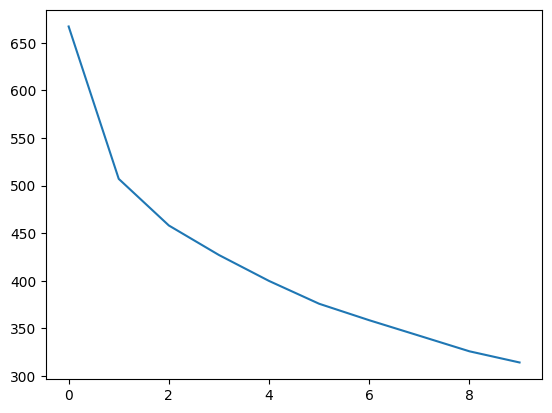

In [ ]:
plt.plot(losses);

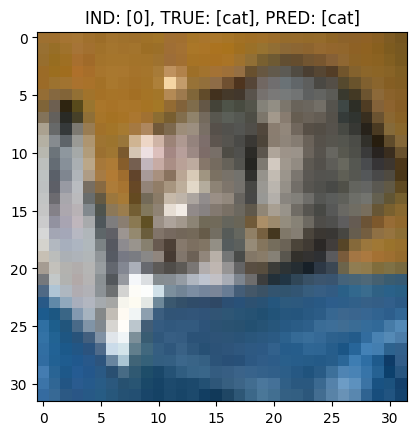

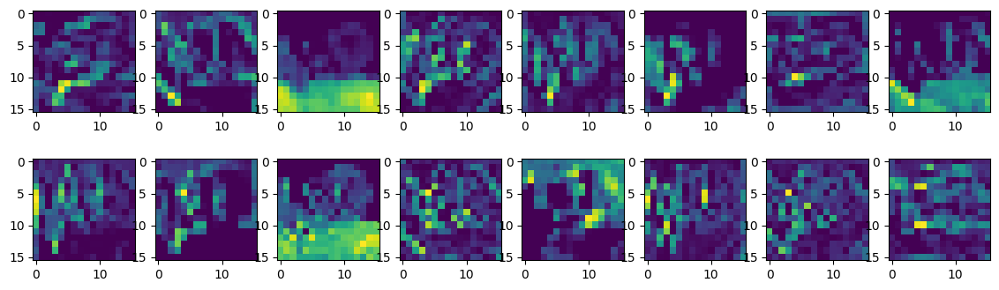

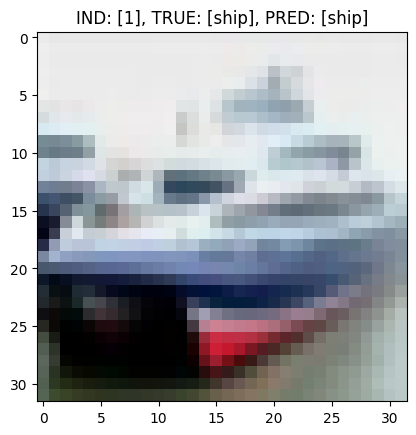

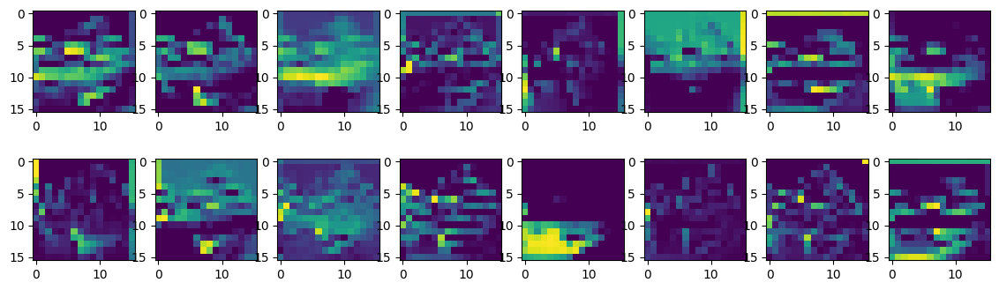

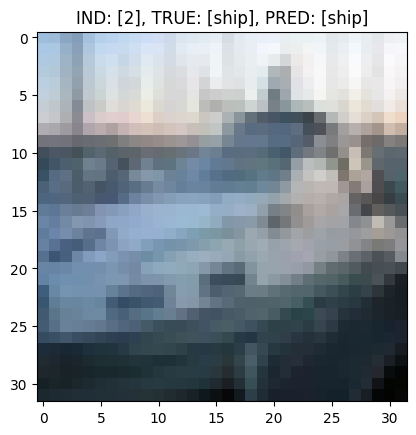

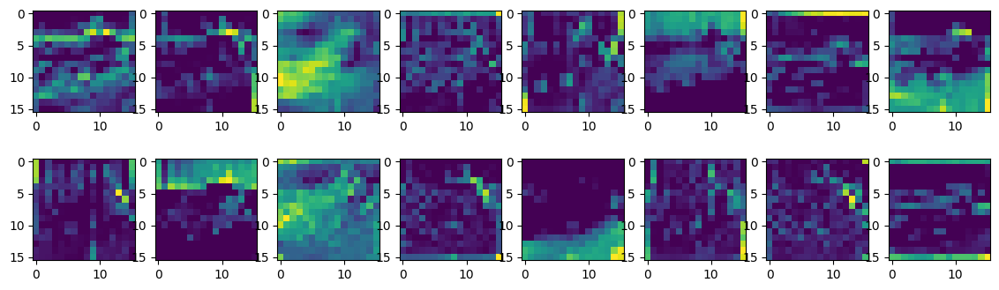

In [ ]:
model.eval()
class_names = trainset.classes
with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets

        outputs = model.forward(inputs)
        outputs_1l = model.forward_1l(inputs)
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{class_names[trgt]}], PRED: [{class_names[pred]}]")
            inpt = (inpt / 2 + 0.5).numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(2,8, figsize=(14, 4))

            j = 0
            for axi in ax:
                for axj in axi:
                    curr = (out_1l[j] / 2 +0.5).numpy()
#                     print(curr.shape)
                    axj.imshow(curr)
                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
model.eval()

true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets
        outputs = model(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))
print(true)
print(predict)

tensor([3., 8., 8.,  ..., 5., 1., 7.])
tensor([3., 8., 8.,  ..., 5., 1., 7.])


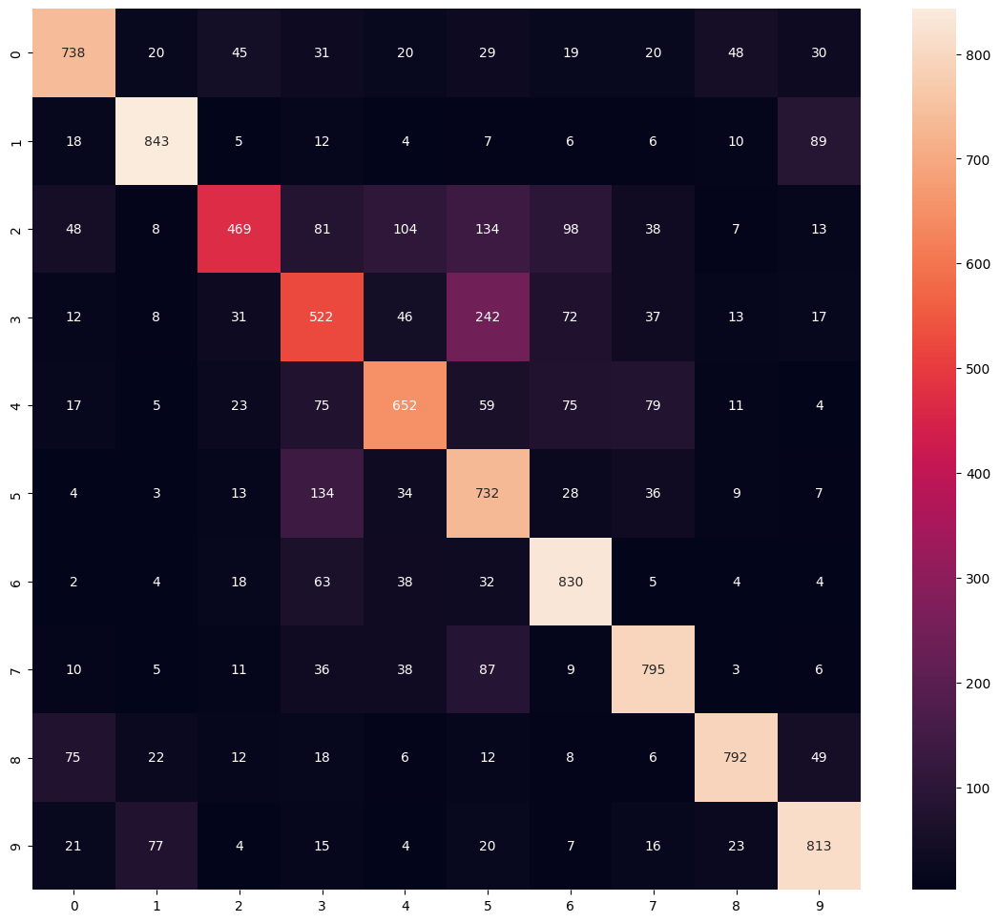

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.7186


In [ ]:
torch.save(model.state_dict(), 'model_Fashion_CIFAR_cnn_paramonov.pth')

## 3. Загрузка изображений из внешних источников

### 3.1 Решить задачу классификации обезьян (датасет [monkey.zip](https://disk.yandex.ru/d/OxYgY4S7aR6ulQ)).
* Загрузить архив с данными на диск
* Создать датасет на основе файлов при помощи `torchvision.datasets.ImageFolder`
* Преобразовать изображения к тензорами одного размера (например, 400х400). Потестировать другие преобразования из `torchvision.transforms`
* Предложить архитектуру модели для решения задачи. Обучить модель.
* Используя тестовое множество

  * Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

  * Вывести матрицу ошибок.

  * Вывести значение accuracy на тестовом множестве.
  * Добиться значения accuracy на тестовом множестве не менее 60%

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
from tqdm import tqdm
zf = zipfile.ZipFile('/content/drive/MyDrive/Colab Notebooks/monkeys.zip')
for file in tqdm(zf.infolist()):
  zf.extract(file)

100%|██████████| 1371/1371 [00:15<00:00, 89.87it/s] 


In [ ]:
zf

<zipfile.ZipFile filename='/content/drive/MyDrive/Colab Notebooks/monkeys.zip' mode='r'>

In [ ]:
transform=transforms.Compose([
            transforms.Resize((200, 200)),
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
        ])
batch_size = 100
trainset = datasets.ImageFolder(root='training/training',
                                         transform=transform)

train_dl = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True)

testset =datasets.ImageFolder(root='validation/validation',
                                        transform=transform)
1
test_dl = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False)

In [ ]:
test_dl.dataset

Dataset ImageFolder
    Number of datapoints: 272
    Root location: validation/validation
    StandardTransform
Transform: Compose(
               Resize(size=(200, 200), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )

In [ ]:
num_classes = len(trainset.classes)
print("Количество классов в датасете:", num_classes)

Количество классов в датасете: 10


In [ ]:
class MonkeyNet(nn.Module):
    def __init__(self):
        super(MonkeyNet, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(
                in_channels=3,
                out_channels=16,
                kernel_size=3,
                padding=1,
            ),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(
                in_channels=16,
                out_channels=32,
                kernel_size=3,
                padding=1,
            ),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(
                in_channels=32,
                out_channels=64,
                kernel_size=3,
                padding=1,
            ),
            nn.BatchNorm2d(64),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )

        self.fc1 = nn.Sequential(
            nn.Dropout(p=0.5),
            nn.Linear(in_features=40000, out_features=2048),
#             nn.Linear(in_features=600, out_features=120),
            nn.Linear(in_features=2048, out_features=10),
        )


    def forward(self, x):
        x = self.conv1(x) # первый сверточный слой
        x = self.conv2(x)
        x = self.conv3(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

    def forward_1l(self, x):
        x = self.conv1(x) # первый сверточный слой
        return x

In [ ]:
monkey_net = MonkeyNet()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(monkey_net.parameters(), lr=0.0001)

In [ ]:
param_num = sum(p.numel() for p in monkey_net.parameters())
print("Количество параметров:", param_num)

Количество параметров: 81966346


In [ ]:
losses = []
for epoch in range(10):
    total_loss, train_accuracy = train(monkey_net, train_dl, optimizer, criterion)
    losses.append(total_loss.item())
    test_accuracy = test(monkey_net, test_dl)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}]")

epoch [1]: Loss: [84.9947], Train_acc: [0.3036], Test_acc: [0.1176]
epoch [2]: Loss: [31.1537], Train_acc: [0.5816], Test_acc: [0.2243]
epoch [3]: Loss: [14.0876], Train_acc: [0.7502], Test_acc: [0.4007]
epoch [4]: Loss: [6.8040], Train_acc: [0.8432], Test_acc: [0.5478]
epoch [5]: Loss: [2.7256], Train_acc: [0.9234], Test_acc: [0.6140]
epoch [6]: Loss: [1.4883], Train_acc: [0.9544], Test_acc: [0.6434]
epoch [7]: Loss: [0.6749], Train_acc: [0.9845], Test_acc: [0.6544]
epoch [8]: Loss: [0.2626], Train_acc: [0.9954], Test_acc: [0.6654]
epoch [9]: Loss: [0.1928], Train_acc: [0.9964], Test_acc: [0.6544]
epoch [10]: Loss: [0.0986], Train_acc: [1.0000], Test_acc: [0.6618]


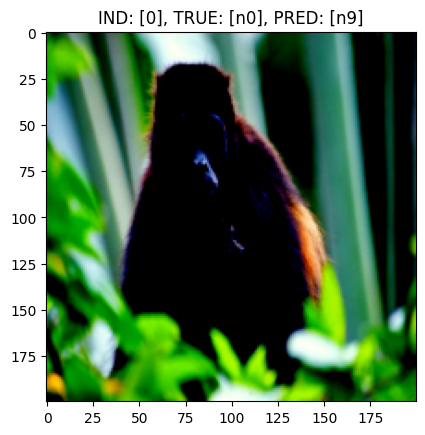

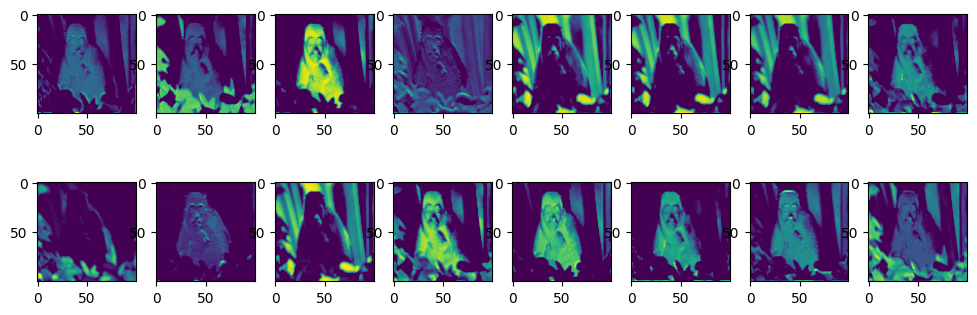

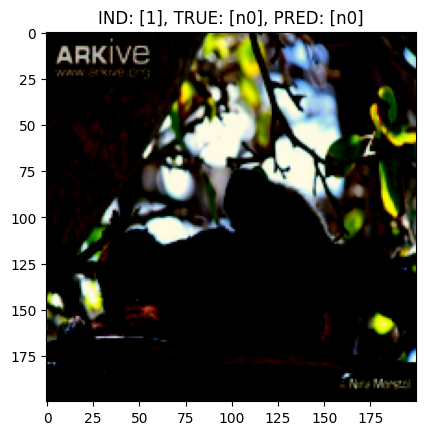

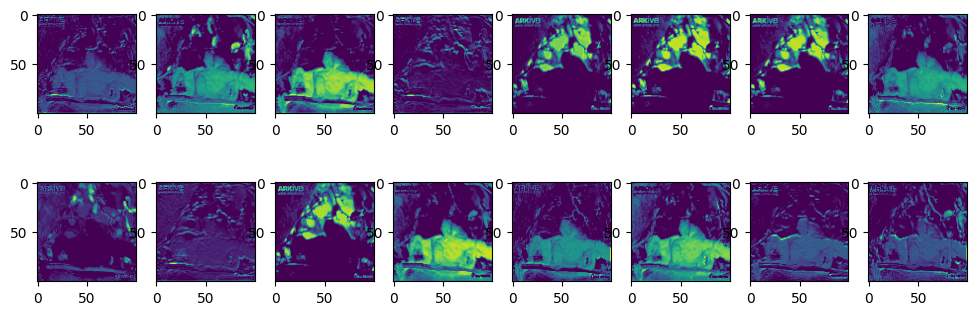

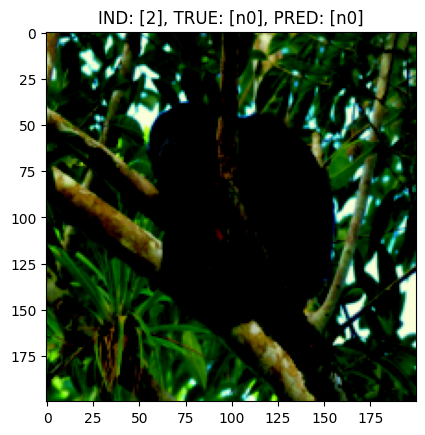

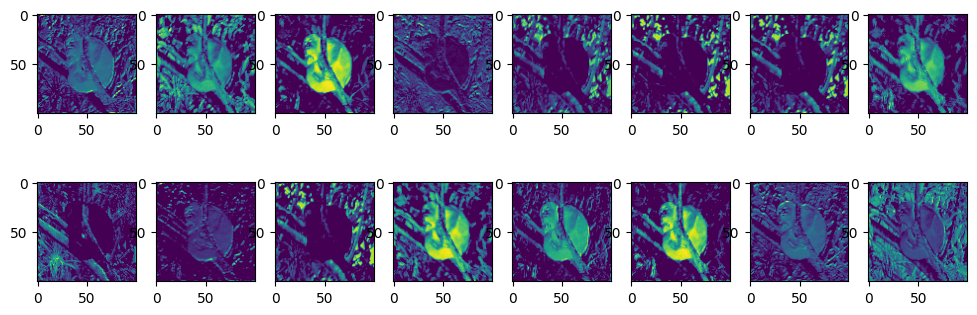

In [ ]:
monkey_net.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets

        outputs = monkey_net.forward(inputs)
        outputs_1l = monkey_net.forward_1l(inputs)
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs, targets, predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trainset.classes[trgt]}], PRED: [{trainset.classes[pred]}]")
            inpt = inpt.numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(2,8, figsize=(12, 4))

            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j])
                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
monkey_net.eval()

true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs, targets

        outputs = monkey_net(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict, predictions_indices))

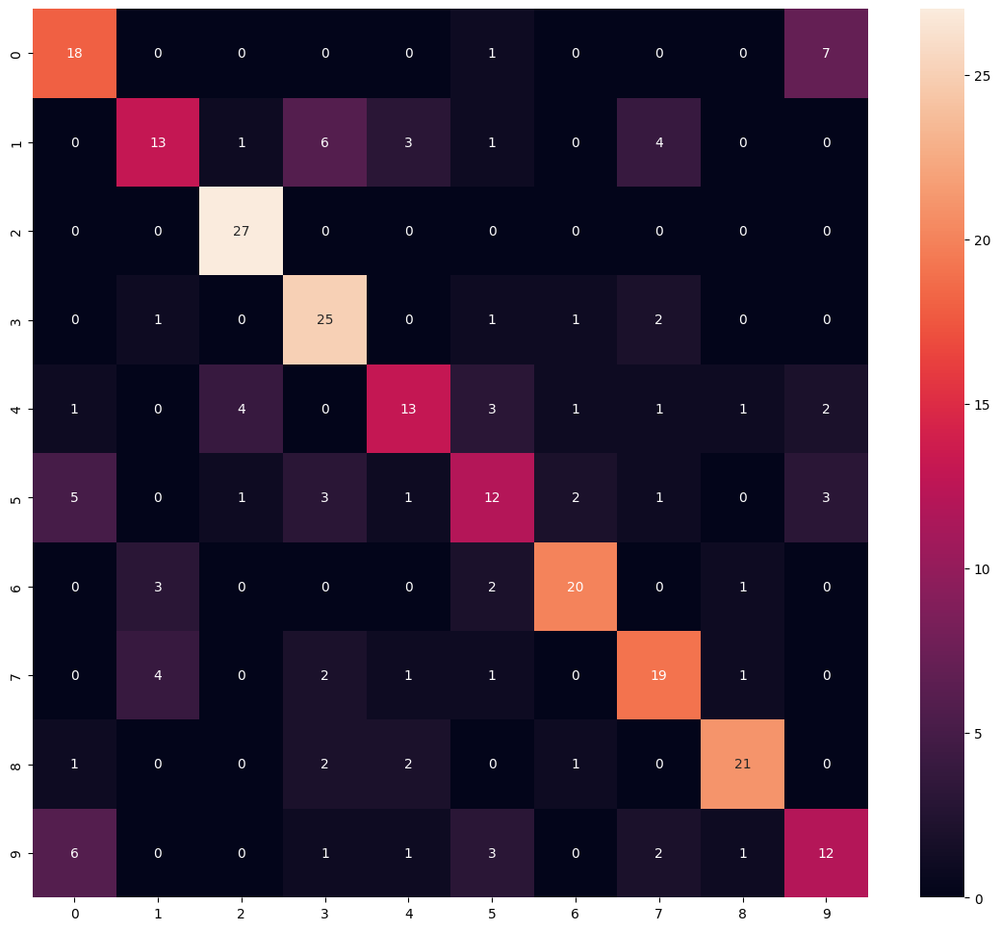

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

In [ ]:
total_accuracy = torch.sum(true==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.6618


In [ ]:
torch.save(monkey_net.state_dict(), 'model_monkey_paramonov.pth')

### 3.2 Решить задачу классификации собак и кошек (датасет [cats_dogs.zip](https://disk.yandex.ru/d/wQtt5O1JF9ctnA)).
* Загрузить архив с данными на диск
* Создать датасет на основе файлов при помощи `torchvision.datasets.ImageFolder`
* Преобразовать изображения к тензорами одного размера (например, 400х400). Потестировать другие преобразования из `torchvision.transforms`
* Предложить архитектуру модели для решения задачи. Обучить модель.
* Используя тестовое множество

  * Продемонстрировать работу модели: вывести несколько изображений, указать над ними правильный класс и класс, предсказанный моделью.

  * Вывести матрицу ошибок.

  * Вывести значение accuracy на тестовом множестве.
  * Добиться значения accuracy на тестовом множестве не менее 80%

In [ ]:
def train_cuda(model, device, train_dl, optimizer, criterion, squeeze_inputs = False, shape=[-1,28*28]):
    model.train()

    total_loss = 0.0
    total_samples = 0.0
    correct_samples = 0.0

    for (inputs, targets) in train_dl:
        inputs, targets = inputs.to(device), targets.to(device)
        if squeeze_inputs:
            inputs = inputs.reshape(shape[0], shape[1]).to(device)

        outputs = model(inputs)
        loss = criterion(outputs, targets.squeeze())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss

        total_samples += targets.shape[0]

        _, prediction_indices = torch.max(outputs, 1)
        correct_samples += torch.sum(prediction_indices==targets)

    train_accuracy = float(correct_samples) / total_samples

    return total_loss, train_accuracy

In [ ]:
def test_cuda(model, device, test_dl, criterion, squeeze_inputs = False):
    model.eval()

    total_loss = 0.0
    total_samples = 0.0
    correct_samples = 0.0

    with torch.no_grad():
      for inputs, targets in test_dl:
          inputs, targets = inputs.to(device), targets.to(device)
          if squeeze_inputs:
              inputs = inputs.reshape(-1, 28*28).to(device)

          outputs = model(inputs)
          loss = criterion(outputs, targets.squeeze())
          total_loss += loss


          total_samples += targets.shape[0]
          _, predictions_indices = torch.max(outputs, 1)
          correct_samples += torch.sum(predictions_indices==targets)

    test_accuracy = correct_samples / total_samples

    return total_loss, test_accuracy

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
import zipfile
from tqdm import tqdm
zf = zipfile.ZipFile('/content/drive/MyDrive/Colab Notebooks/cats_dogs.zip')
for file in tqdm(zf.infolist()):
  zf.extract(file)

100%|██████████| 25004/25004 [00:13<00:00, 1825.91it/s]


In [ ]:
transform=transforms.Compose([
            transforms.Resize((100, 100)),
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
        ])

batch_size = 100
dataset =  datasets.ImageFolder('cats_dogs/train', transform=transform)

traindataset, testdataset = torch.utils.data.random_split(dataset, [0.8, 0.2])
train_dl = torch.utils.data.DataLoader(dataset=traindataset, batch_size=batch_size, shuffle=True)
test_dl = torch.utils.data.DataLoader(dataset=testdataset,batch_size=batch_size, shuffle=False)

In [ ]:
num_classes = len(dataset.classes)
print("Количество классов в датасете:", num_classes)

Количество классов в датасете: 2


In [ ]:
print(len(traindataset), len(testdataset))

20000 5000


In [ ]:
class CatsDogsNet(nn.Module):
    def __init__(self):
        super(CatsDogsNet, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(
                in_channels=3,
                out_channels=64,
                kernel_size=3,
                padding=1,
            ),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(
                in_channels=64,
                out_channels=64,
                kernel_size=3,
                padding=1,
            ),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(
                in_channels=64,
                out_channels=128,
                kernel_size=3,
                padding=1,
            ),
            nn.BatchNorm2d(128),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(
                in_channels=128,
                out_channels=256,
                kernel_size=3,
                padding=1,
            ),
            nn.BatchNorm2d(256),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )

        self.fc1 = nn.Sequential(
            nn.Dropout(p=0.5),
            nn.Linear(in_features=9216, out_features=2048),
            nn.Linear(in_features=2048, out_features=120),
            nn.Linear(in_features=120, out_features=2),
        )


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

    def forward_1l(self, x):
        x = self.conv1(x)
        return x

In [ ]:
cats_dogs_net = CatsDogsNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(cats_dogs_net.parameters(), lr=0.001)

In [ ]:
param_num = sum(p.numel() for p in cats_dogs_net.parameters())
print("Количество параметров:", param_num)

Количество параметров: 19531306


In [ ]:
losses = []
for epoch in range(10):
    total_loss, train_accuracy = train_cuda(cats_dogs_net, device, train_dl, optimizer, criterion)
    losses.append(total_loss.item())
    test_accuracy = test_cuda(cats_dogs_net, device, test_dl)

    print(f"epoch [{epoch+1}]: Loss: [{total_loss:.4f}], Train_acc: [{train_accuracy:.4f}],"
         f" Test_acc: [{test_accuracy:.4f}]")
    if test_accuracy >=0.8:
        break

epoch [1]: Loss: [282.9042], Train_acc: [0.5584], Test_acc: [0.6292]
epoch [2]: Loss: [126.8177], Train_acc: [0.6494], Test_acc: [0.6878]
epoch [3]: Loss: [112.5682], Train_acc: [0.7150], Test_acc: [0.7290]
epoch [4]: Loss: [101.0984], Train_acc: [0.7577], Test_acc: [0.6638]
epoch [5]: Loss: [88.6886], Train_acc: [0.7956], Test_acc: [0.7710]
epoch [6]: Loss: [82.4971], Train_acc: [0.8127], Test_acc: [0.8060]


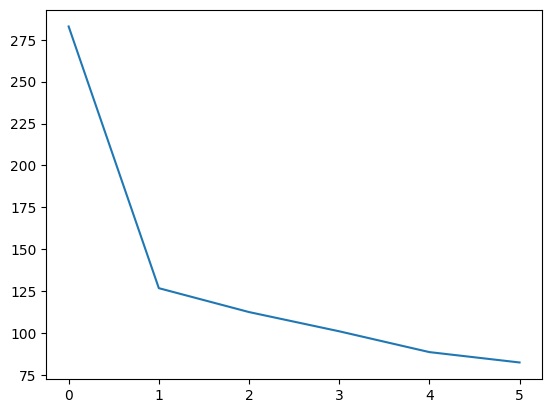

In [ ]:
plt.plot(losses);

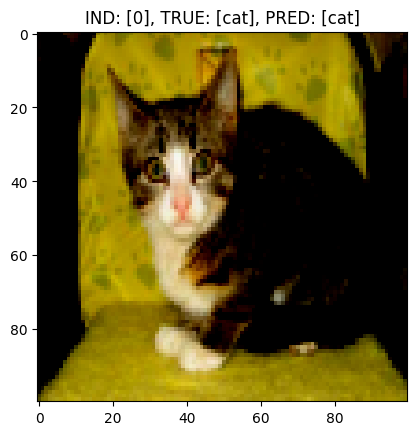

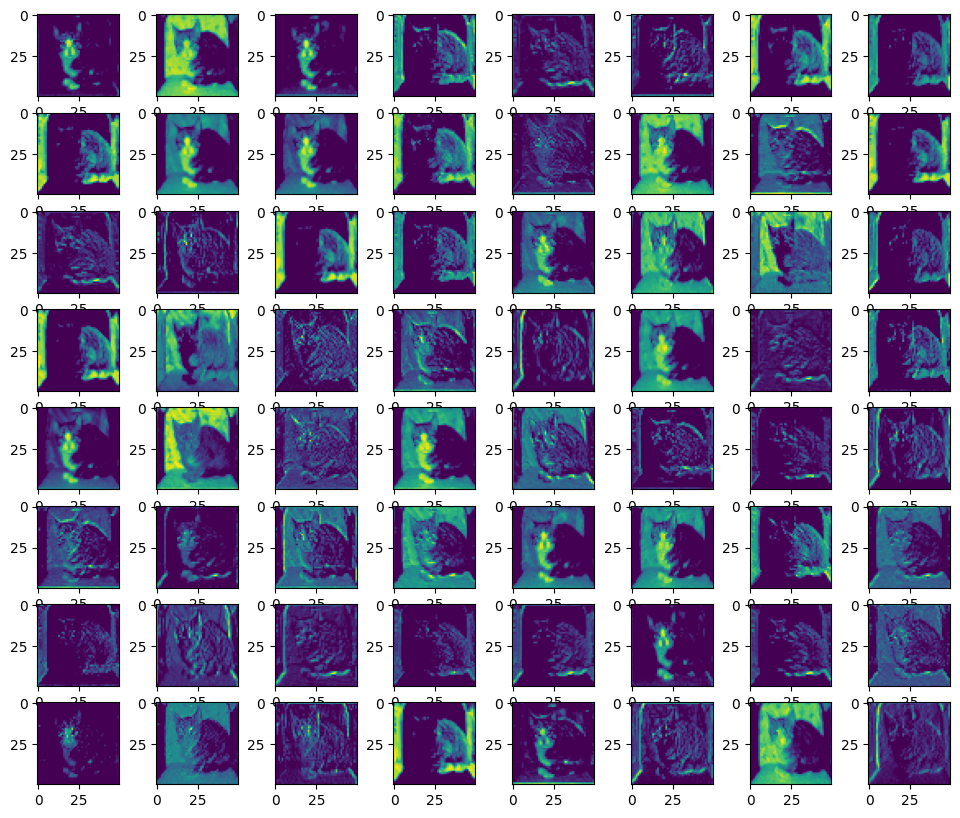

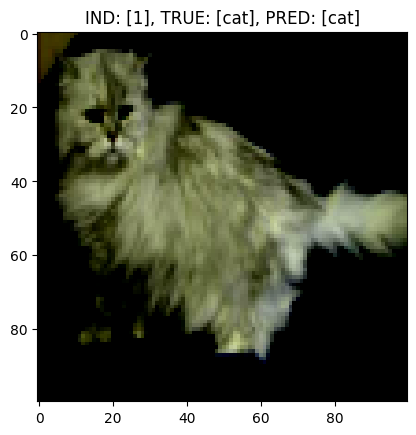

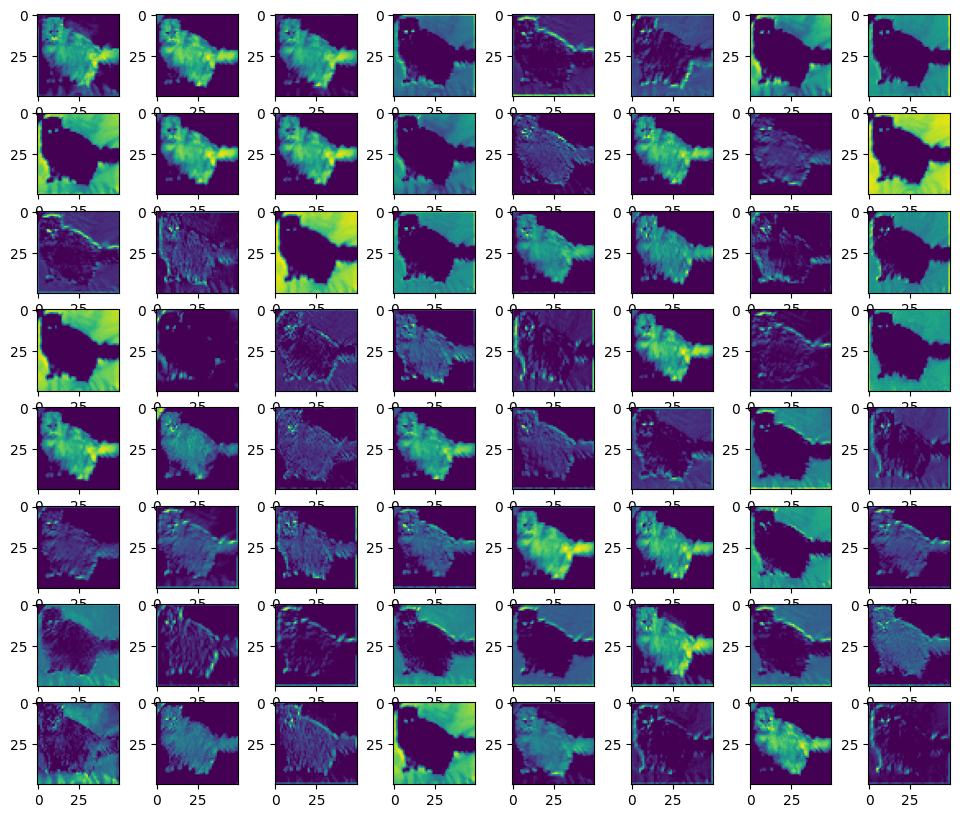

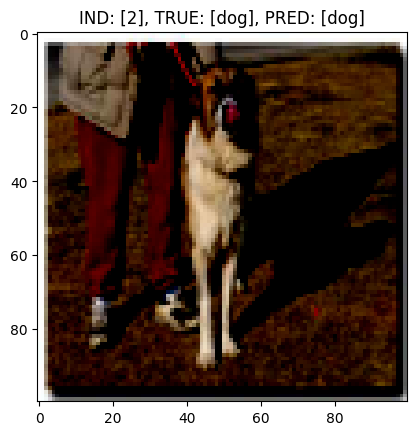

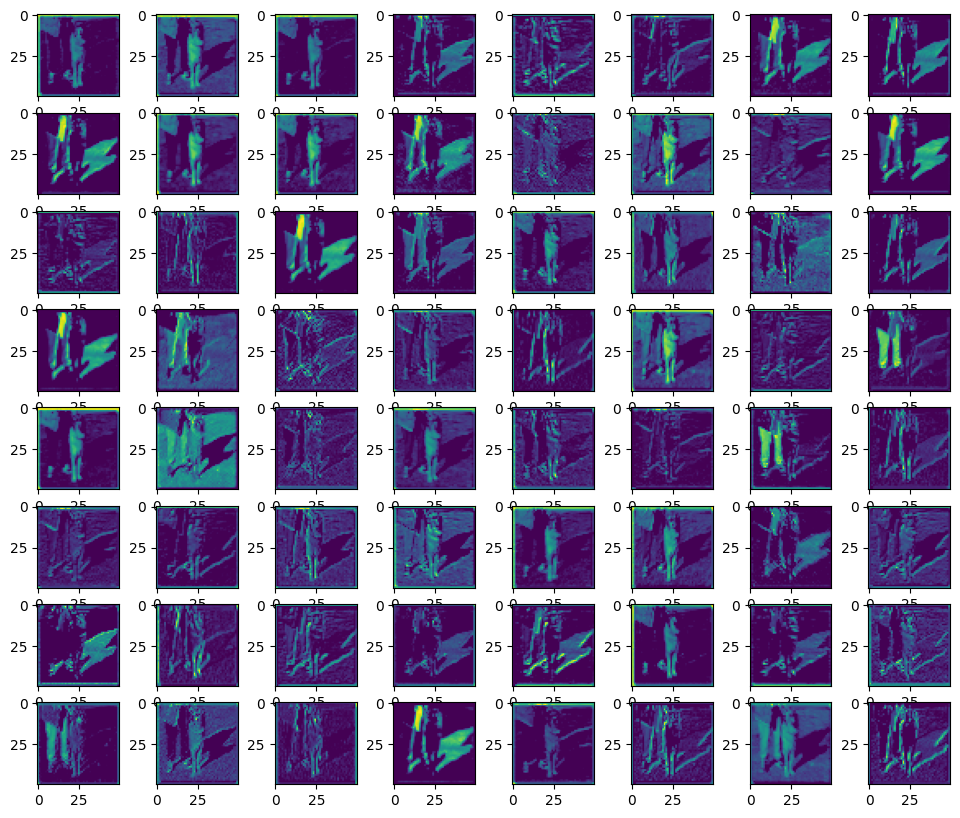

In [ ]:
cats_dogs_net.eval()

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = cats_dogs_net.forward(inputs)
        outputs_1l = cats_dogs_net.forward_1l(inputs).to('cpu')
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs.to('cpu'), targets.to('cpu'), predictions_indices.to('cpu'), outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{traindataset.dataset.classes[trgt]}], PRED: [{traindataset.dataset.classes[pred]}]")
            inpt = inpt.numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(8,8, figsize=(12, 10))

            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j])
                    j+=1

            plt.show()
            if i==2:
                break
        break

In [ ]:
cats_dogs_net.eval()

true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets

        outputs = cats_dogs_net(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict.to(device), predictions_indices))

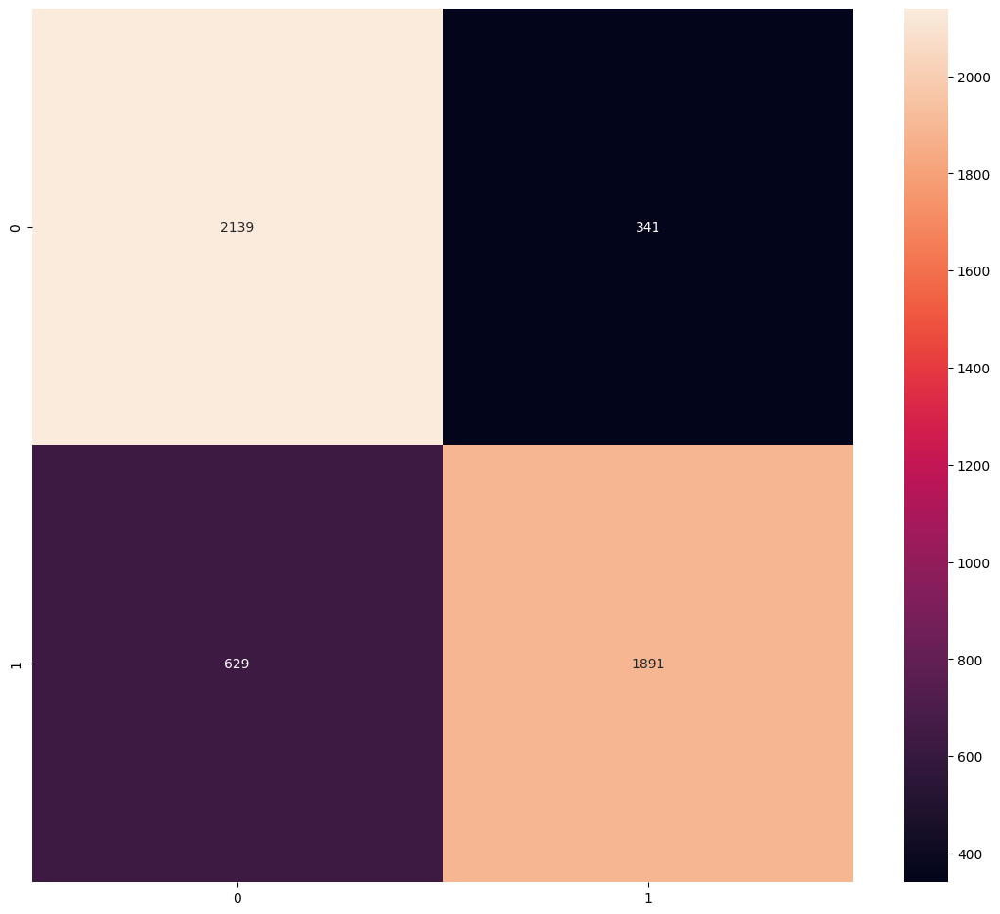

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.to('cpu').numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

In [ ]:
total_accuracy = torch.sum(true.to(device)==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.8060


In [ ]:
torch.save(cats_dogs_net.state_dict(), 'model_cats_dogs.pth')

# 4. Transfer Learning

### 4.1 Решить задачу 3.1, воспользовавшись предобученной моделью VGG16
* Загрузить данные для обучения
* Преобразования: размер 224x224, нормализация с параметрами `mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)`
* Заменить последний полносвязный слой модели в соответствии с задачей
* Дообучить модель (не замораживать веса). Вычислить значение accuracy на тестовом множестве
* Дообучить модель (заморозить все веса, кроме последнего блока слоев (`classifier`)).
* Вычислить значение accuracy на тестовом множестве.


In [ ]:
def train_cuda(model, device, train_dl, optimizer, criterion, squeeze_inputs = False):
    model.train()

    total_loss = 0.0
    total_samples = 0.0
    correct_samples = 0.0

    for (inputs, targets) in train_dl:
        inputs, targets = inputs.to(device), targets.to(device)
        if squeeze_inputs:
            inputs = inputs.reshape(shape[0], shape[1]).to(device)

        outputs = model(inputs)
        loss = criterion(outputs, targets.squeeze())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss

        total_samples += targets.shape[0]

        _, prediction_indices = torch.max(outputs, 1)
        correct_samples += torch.sum(prediction_indices==targets)

    train_accuracy = float(correct_samples) / total_samples

    return total_loss, train_accuracy

In [ ]:
def test_cuda(model, device, test_dl, criterion, squeeze_inputs = False):
    model.eval()

    total_loss = 0.0
    total_samples = 0.0
    correct_samples = 0.0

    with torch.no_grad():
      for inputs, targets in test_dl:
          inputs, targets = inputs.to(device), targets.to(device)
          if squeeze_inputs:
              inputs = inputs.reshape(-1, 28*28).to(device)

          outputs = model(inputs)
          loss = criterion(outputs, targets.squeeze())
          total_loss += loss


          total_samples += targets.shape[0]
          _, predictions_indices = torch.max(outputs, 1)
          correct_samples += torch.sum(predictions_indices==targets)

    test_accuracy = correct_samples / total_samples

    return total_loss, test_accuracy

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Загрузить данные для обучения

In [ ]:
import zipfile
from tqdm import tqdm
zf = zipfile.ZipFile('/content/drive/MyDrive/Colab Notebooks/monkeys.zip')
for file in tqdm(zf.infolist()):
  zf.extract(file)

100%|██████████| 1371/1371 [00:14<00:00, 92.44it/s] 


Преобразования: размер 224x224, нормализация с параметрами mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)

In [ ]:
transform=transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
        ])
batch_size = 100
trainset = datasets.ImageFolder(root='training/training',
                                         transform=transform)

train_dl = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True)

testset =datasets.ImageFolder(root='validation/validation',
                                        transform=transform)
1
test_dl = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False)

In [ ]:
models.vgg16()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Заменить последний полносвязный слой модели в соответствии с задачей

In [ ]:
vgg16 = models.vgg16(weights='IMAGENET1K_V1')
vgg16.classifier[6] = nn.Linear(4096, 10)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:04<00:00, 119MB/s]


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
vgg16 = vgg16.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(vgg16.parameters(), lr=0.005)

In [ ]:
param_num = sum(p.numel() for p in vgg16.parameters())
print("Количество параметров:", param_num)

Количество параметров: 134301514


In [ ]:
losses_train, losses_test = [], []
for epoch in range(5):
    total_loss_train, train_accuracy = train_cuda(vgg16, device, train_dl, optimizer, criterion)
    losses_train.append(total_loss_train.item())
    total_loss_test, test_accuracy = test_cuda(vgg16, device, test_dl, criterion)
    losses_test.append(total_loss_test.item())

    print(f"epoch [{epoch+1}]: Loss: [{total_loss_train:.4f}], Train_acc: [{train_accuracy:.4f}],"
                            f" Loss: [{total_loss_test:.4f}], Test_acc: [{test_accuracy:.4f}]")
    if test_accuracy >=0.95:
        break

epoch [1]: Loss: [114855.6719], Train_acc: [0.1003], Loss: [319.0833], Test_acc: [0.0956]
epoch [2]: Loss: [1224.8374], Train_acc: [0.0902], Loss: [21.1782], Test_acc: [0.1029]
epoch [3]: Loss: [9601.4873], Train_acc: [0.0966], Loss: [45.5553], Test_acc: [0.0919]
epoch [4]: Loss: [669.7956], Train_acc: [0.0975], Loss: [7.1103], Test_acc: [0.0919]
epoch [5]: Loss: [27.3303], Train_acc: [0.1030], Loss: [6.9541], Test_acc: [0.0956]


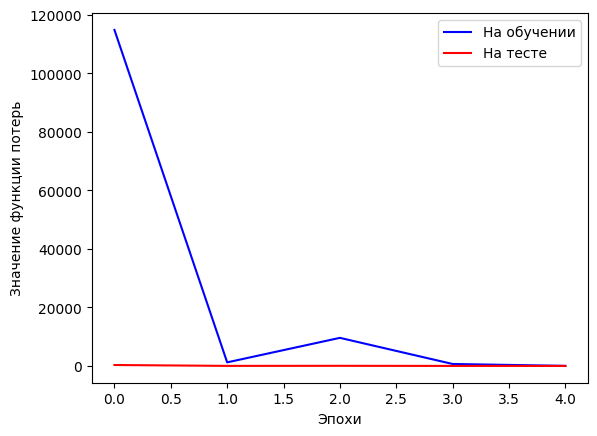

In [ ]:
plt.plot(losses_train, label='На обучении', color='blue')
plt.plot(losses_test, label='На тесте', color='red')
plt.legend()
plt.xlabel('Эпохи')
plt.ylabel('Значение функции потерь')
plt.show()

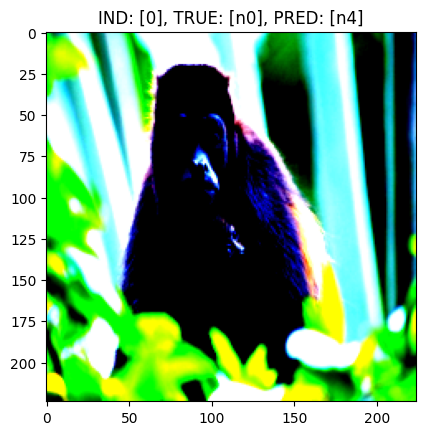

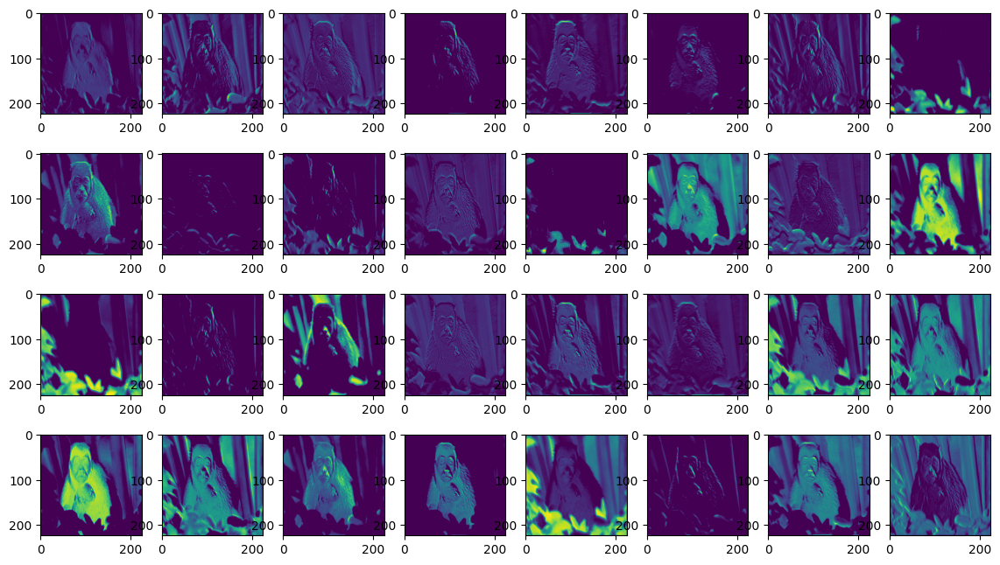

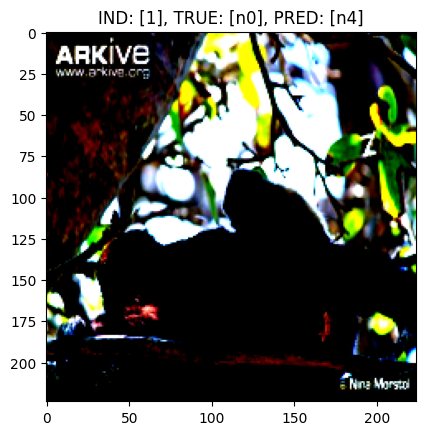

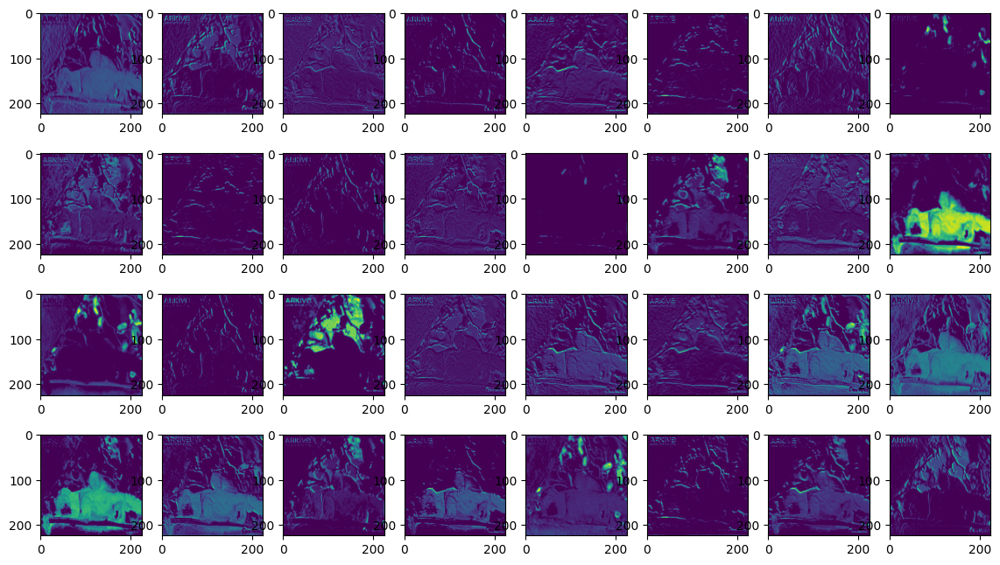

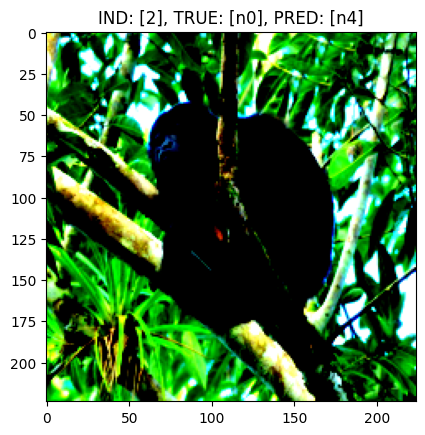

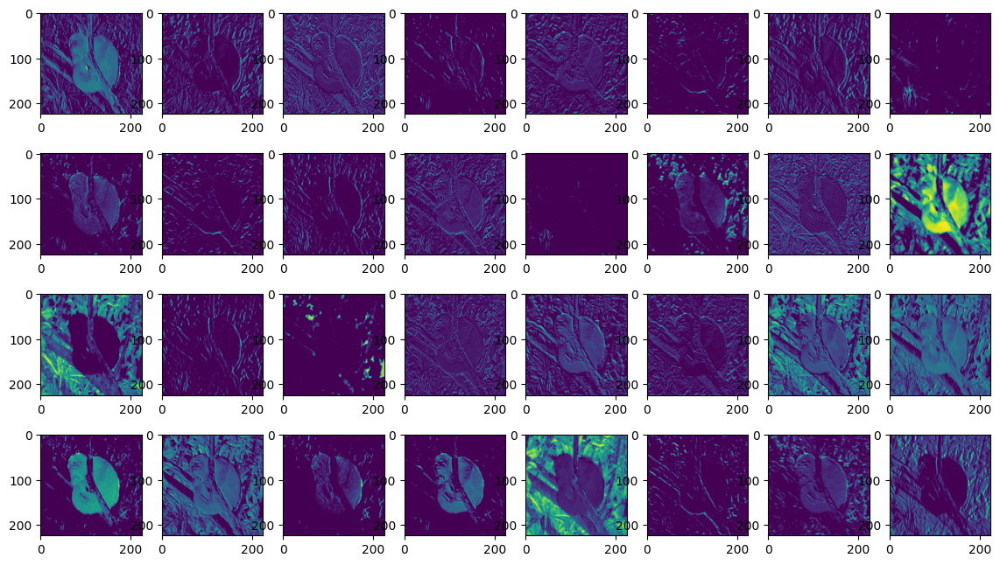

In [ ]:
vgg16.eval()
with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = vgg16.forward(inputs)
        outputs_1l = vgg16.features[:2](inputs).to('cpu')
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs.to('cpu'), targets.to('cpu'), predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trainset.classes[trgt]}], PRED: [{trainset.classes[pred]}]")
            inpt = inpt.numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))
            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j])
                    j+=1
            plt.show()
            if i==2:
                break
        break

In [ ]:
true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets

        outputs = vgg16(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict.to(device), predictions_indices))

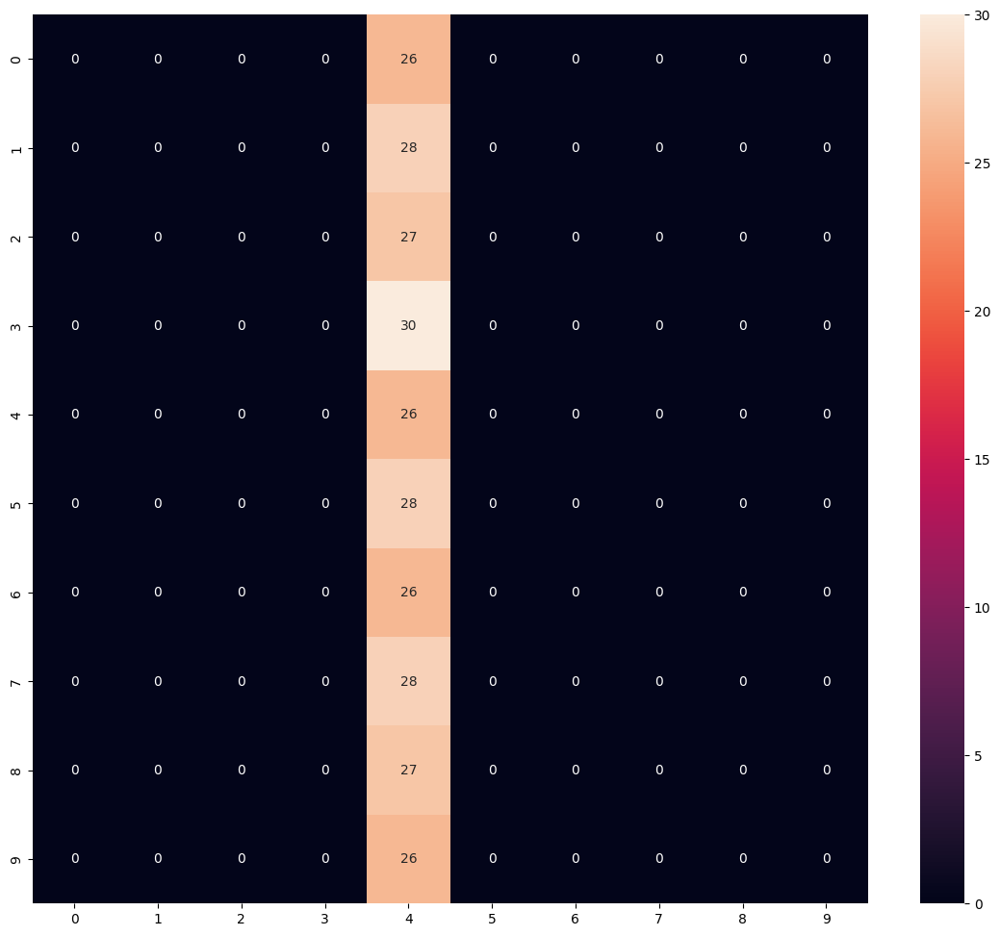

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.to('cpu').numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

In [ ]:
total_accuracy = torch.sum(true.to(device)==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.0956


Дообучить модель (заморозить все веса, кроме последнего блока слоев (classifier)).

In [ ]:
vgg16_freeze = models.vgg16(weights='IMAGENET1K_V1')
for param in vgg16_freeze.features.parameters():
    param.requires_grad = False
vgg16_freeze.classifier[6] = nn.Linear(4096, 10)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(vgg16_freeze.parameters(), lr=0.005)
vgg16_freeze.to(device)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
losses_train, losses_test = [], []
for epoch in range(5):
    total_loss_train, train_accuracy = train_cuda(vgg16_freeze, device, train_dl, optimizer, criterion)
    losses_train.append(total_loss_train.item())
    total_loss_test, test_accuracy = test_cuda(vgg16_freeze, device, test_dl, criterion)
    losses_test.append(total_loss_test.item())

    print(f"epoch [{epoch+1}]: Loss: [{total_loss_train:.4f}], Train_acc: [{train_accuracy:.4f}],"
                            f" Loss: [{total_loss_test:.4f}], Test_acc: [{test_accuracy:.4f}]")
    if test_accuracy >=0.95:
        break

epoch [1]: Loss: [871.8442], Train_acc: [0.1778], Loss: [35.3764], Test_acc: [0.2684]
epoch [2]: Loss: [40.4816], Train_acc: [0.7056], Loss: [1.1614], Test_acc: [0.9559]


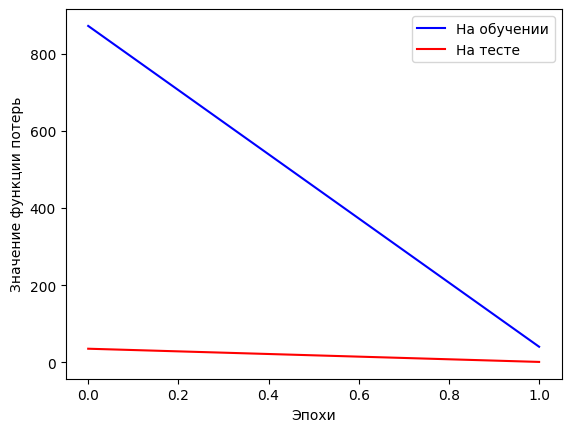

In [ ]:
plt.plot(losses_train, label='На обучении', color='blue')
plt.plot(losses_test, label='На тесте', color='red')
plt.legend()
plt.xlabel('Эпохи')
plt.ylabel('Значение функции потерь')
plt.show()

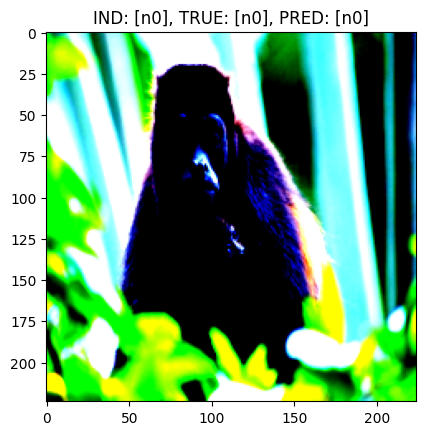

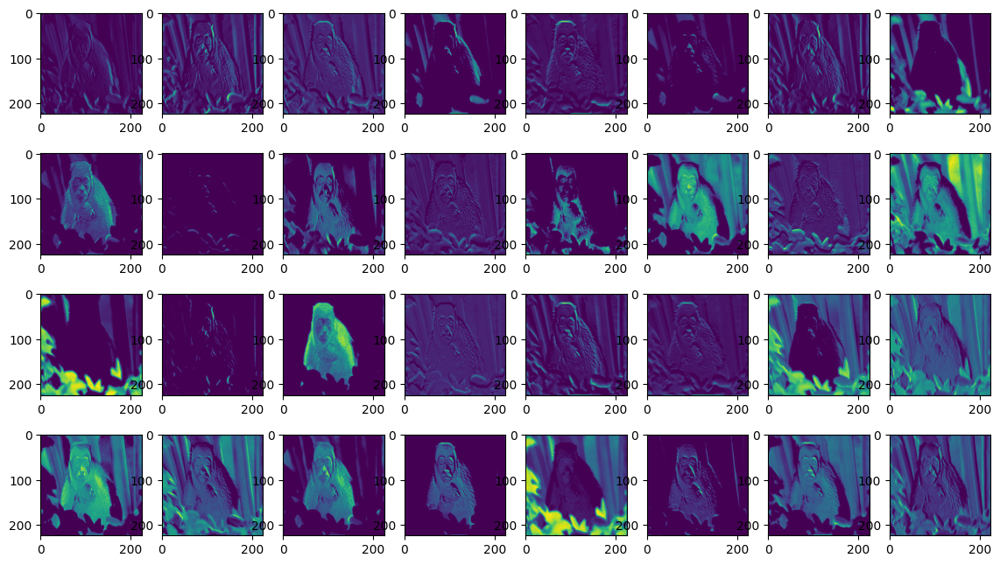

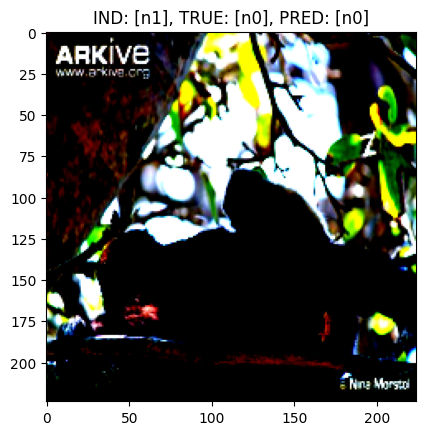

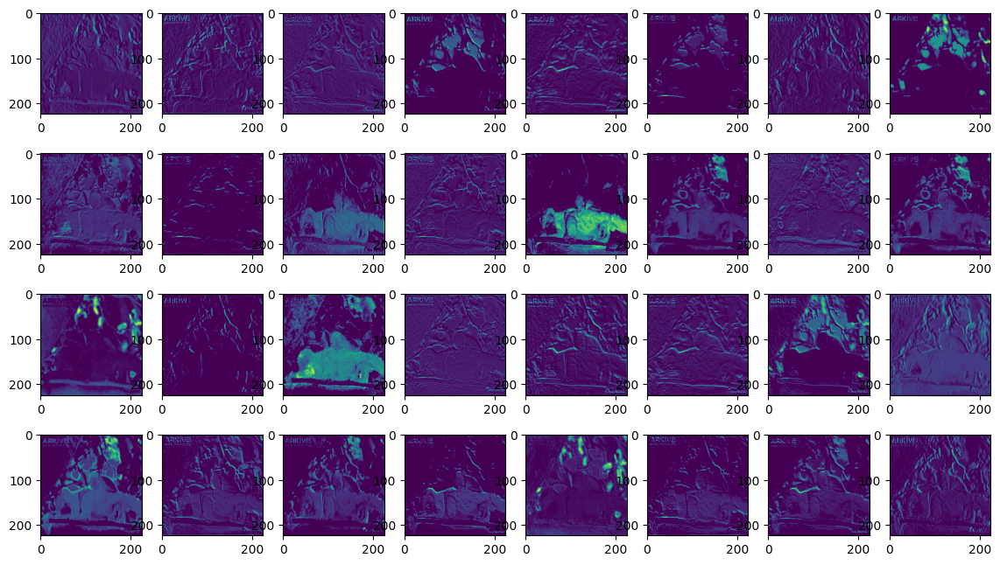

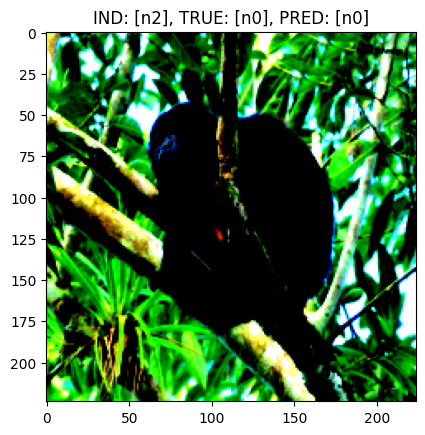

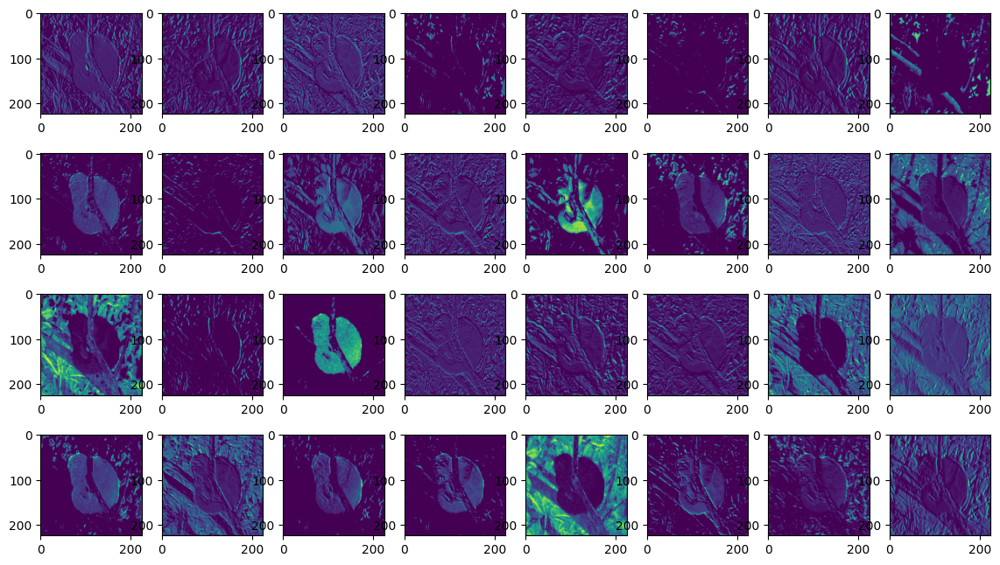

In [ ]:
vgg16_freeze.eval()
with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = vgg16_freeze.forward(inputs)
        outputs_1l = vgg16_freeze.features[:2](inputs).to('cpu')
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs.to('cpu'), targets.to('cpu'), predictions_indices, outputs_1l)):
            plt.title(f"IND: [{trainset.classes[i]}], TRUE: [{trainset.classes[trgt]}], PRED: [{trainset.classes[pred]}]")
            inpt = inpt.numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))
            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j])
                    j+=1
            plt.show()
            if i==2:
                break
        break

In [ ]:
true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets

        outputs = vgg16_freeze(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict.to(device), predictions_indices))

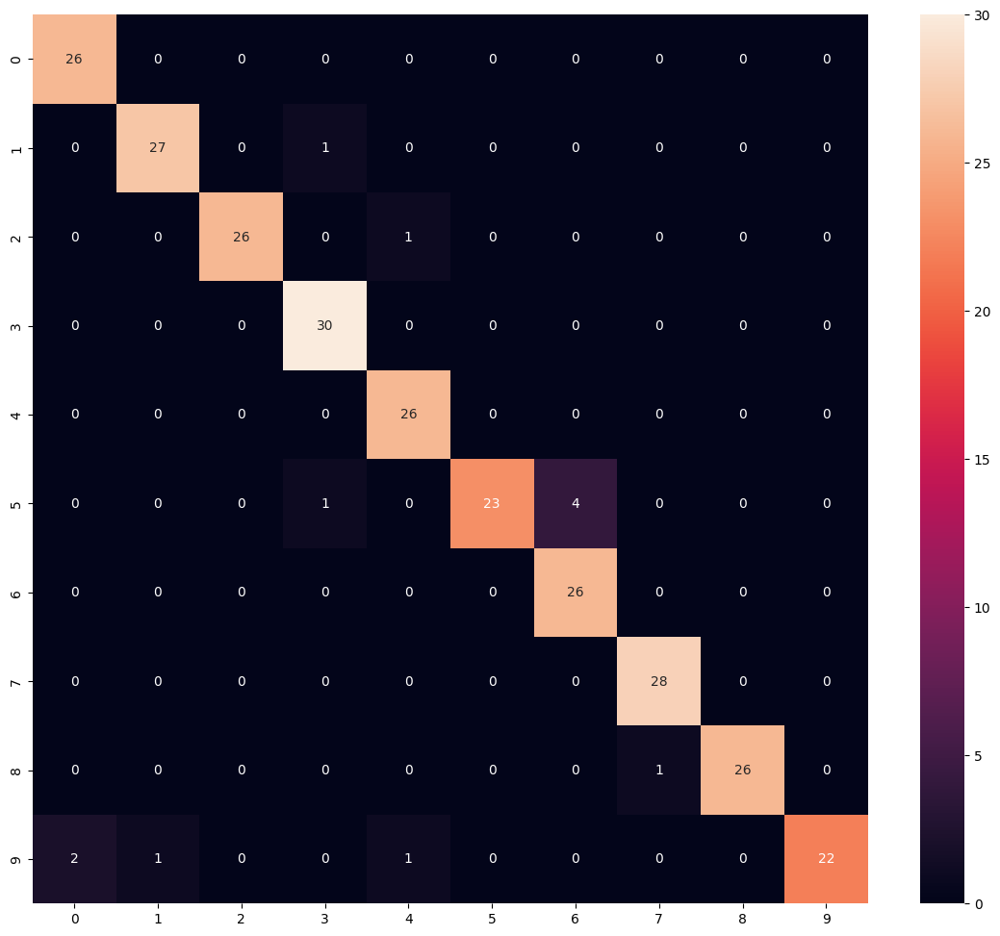

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.to('cpu').numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

In [ ]:
total_accuracy = torch.sum(true.to(device)==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.9559


In [ ]:
torch.save(vgg16_freeze.state_dict(), 'model_vgg16_freeze.pth')

### 4.2 Решить задачу 3.2, воспользовавшись подходящей предобученной моделью
* Не использовать VGG16 (вместо нее можно взять resnet18 или другую)
* Загрузить данные для обучения
* Преобразования: размер 224x224, нормализация с параметрами `mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)`
* Заменить последний полносвязный слой модели в соответствии с задачей
* Дообучить модель.
* Вычислить значение accuracy на тестовом множестве (добиться значения не меньше 97-98%)

In [ ]:
import zipfile
from tqdm import tqdm
zf = zipfile.ZipFile('/content/drive/MyDrive/Colab Notebooks/cats_dogs.zip')
for file in tqdm(zf.infolist()):
  zf.extract(file)

100%|██████████| 25004/25004 [00:23<00:00, 1049.41it/s]


In [ ]:
transform=transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
        ])

batch_size = 100
dataset =  datasets.ImageFolder('cats_dogs/train', transform=transform)

traindataset, testdataset = torch.utils.data.random_split(dataset, [0.8, 0.2])
train_dl = torch.utils.data.DataLoader(dataset=traindataset, batch_size=batch_size, shuffle=True)
test_dl = torch.utils.data.DataLoader(dataset=testdataset,batch_size=batch_size, shuffle=False)

In [ ]:
resnet18_freeze = models.resnet18(weights='IMAGENET1K_V1')
models.resnet18()

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 44.3MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
resnet18_freeze.fc = nn.Linear(512, 2)
for param in resnet18_freeze.parameters():
    param.requires_grad = False
for param in resnet18_freeze.fc.parameters():
    param.requires_grad = True
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet18_freeze.parameters(), lr=0.005)
resnet18_freeze.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
losses_train, losses_test = [], []
for epoch in range(5):
    total_loss_train, train_accuracy = train_cuda(resnet18_freeze, device, train_dl, optimizer, criterion)
    losses_train.append(total_loss_train.item())
    total_loss_test, test_accuracy = test_cuda(resnet18_freeze, device, test_dl, criterion)
    losses_test.append(total_loss_test.item())

    print(f"epoch [{epoch+1}]: Loss: [{total_loss_train:.4f}], Train_acc: [{train_accuracy:.4f}],"
                            f" Loss: [{total_loss_test:.4f}], Test_acc: [{test_accuracy:.4f}]")
    if test_accuracy >=0.98:
        break

epoch [1]: Loss: [24.4677], Train_acc: [0.9488], Loss: [3.1269], Test_acc: [0.9768]
epoch [2]: Loss: [13.3938], Train_acc: [0.9721], Loss: [2.9829], Test_acc: [0.9796]
epoch [3]: Loss: [13.4840], Train_acc: [0.9726], Loss: [3.2820], Test_acc: [0.9760]
epoch [4]: Loss: [13.7046], Train_acc: [0.9730], Loss: [3.7004], Test_acc: [0.9722]
epoch [5]: Loss: [12.3639], Train_acc: [0.9762], Loss: [3.3290], Test_acc: [0.9782]


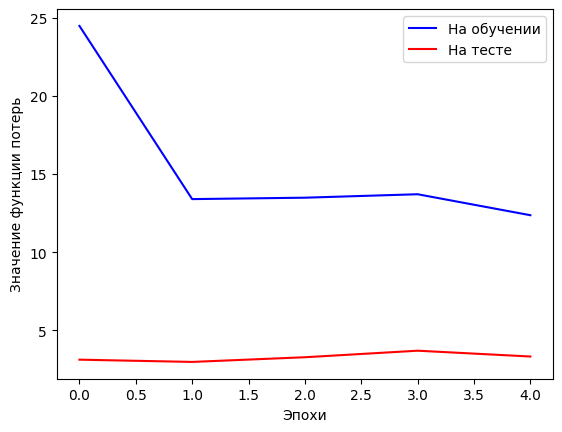

In [ ]:
plt.plot(losses_train, label='На обучении', color='blue')
plt.plot(losses_test, label='На тесте', color='red')
plt.legend()
plt.xlabel('Эпохи')
plt.ylabel('Значение функции потерь')
plt.show()

In [ ]:
list(resnet18_freeze.children())[:4]

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 ReLU(inplace=True),
 MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)]

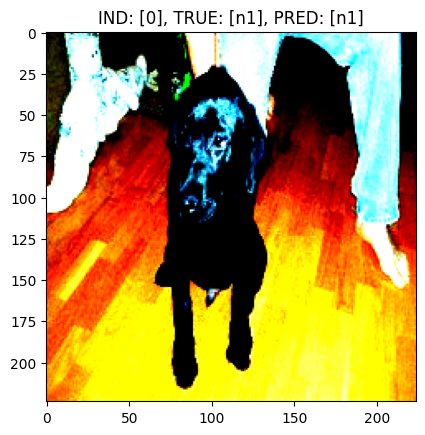

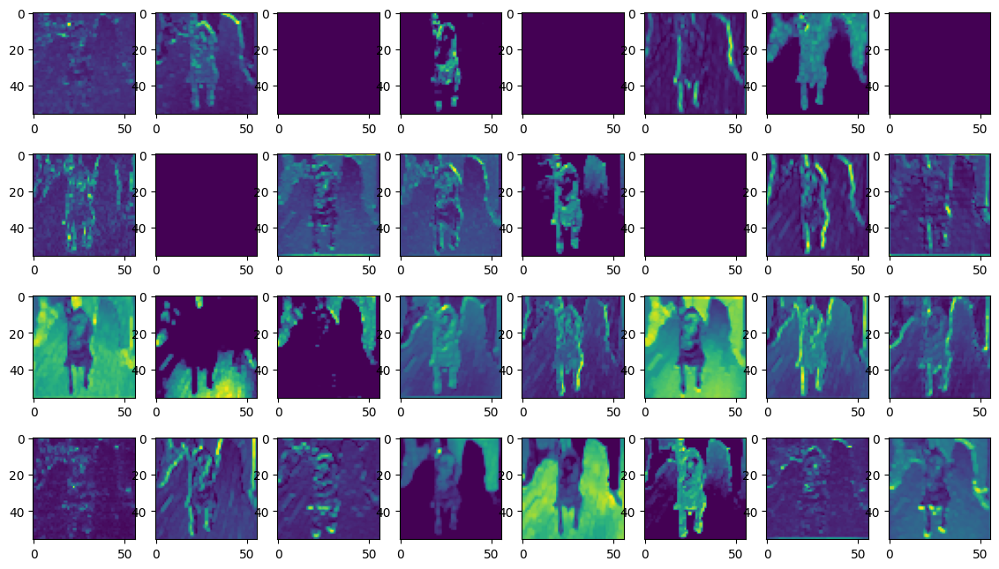

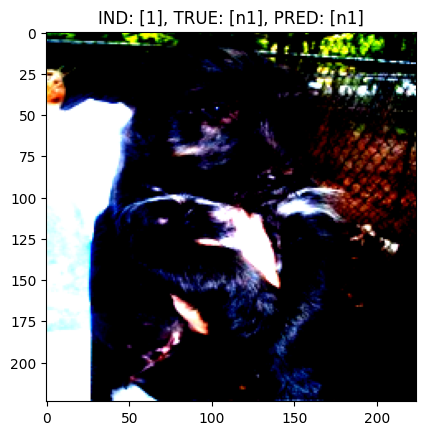

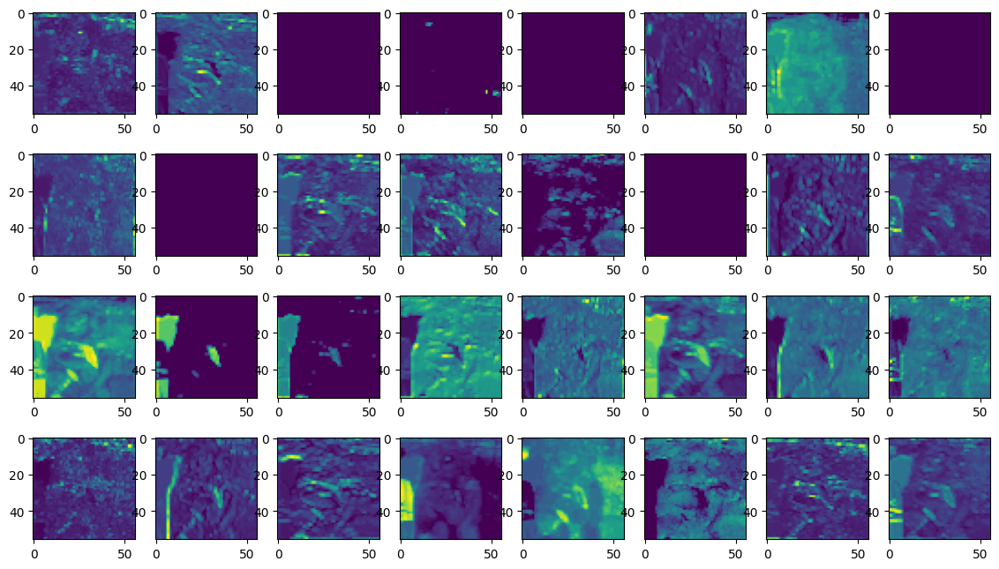

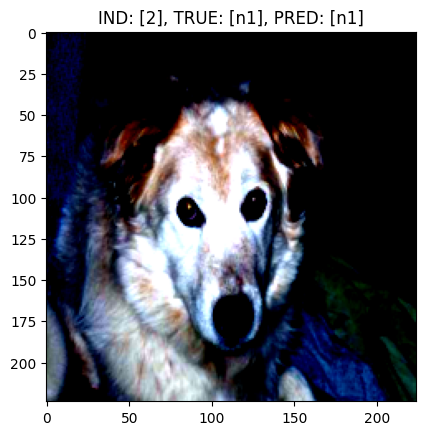

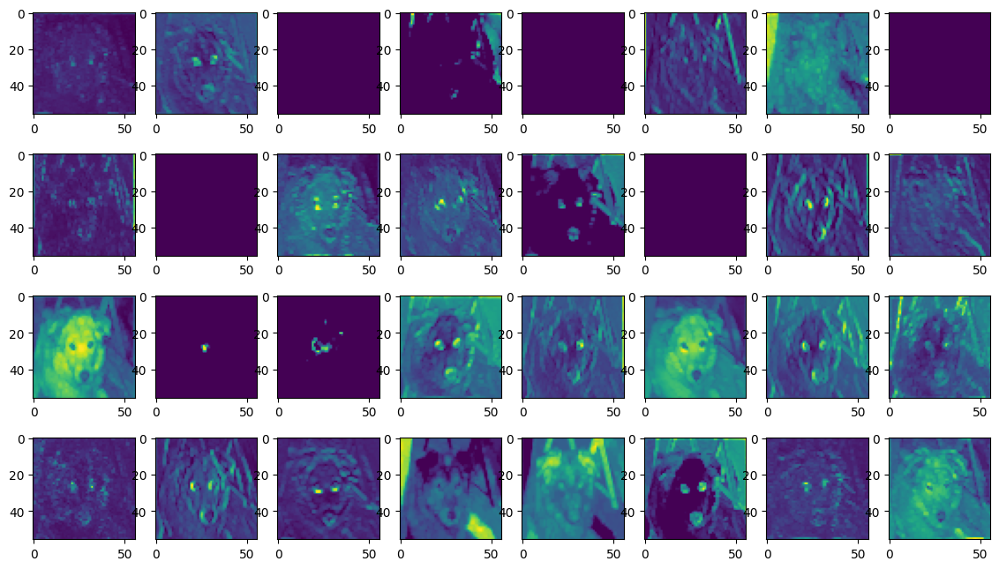

In [ ]:
resnet18_freeze.eval()
with torch.no_grad():
    first_layer = nn.Sequential(*list(resnet18_freeze.children())[:4])
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets.to(device)

        outputs = resnet18_freeze.forward(inputs)
        outputs_1l = first_layer(inputs).to('cpu')
        _, predictions_indices = torch.max(outputs, 1)

        for i, (inpt, trgt, pred, out_1l) in enumerate(zip(inputs.to('cpu'), targets.to('cpu'), predictions_indices, outputs_1l)):
            plt.title(f"IND: [{i}], TRUE: [{trainset.classes[trgt]}], PRED: [{trainset.classes[pred]}]")
            inpt = inpt.numpy()
            plt.imshow(np.transpose(inpt, (1, 2, 0)))
            fig, ax = plt.subplots(4,8, figsize=(14, 8))
            j = 0
            for axi in ax:
                for axj in axi:
                    axj.imshow(out_1l[j])
                    j+=1
            plt.show()
            if i==2:
                break
        break

In [ ]:
true = torch.empty(0)
predict = torch.empty(0)

with torch.no_grad():
    for inputs, targets in test_dl:
        inputs, targets = inputs.to(device), targets

        outputs = resnet18_freeze(inputs)

        _, predictions_indices = torch.max(outputs, 1)

        true = torch.cat((true, targets))
        predict = torch.cat((predict.to(device), predictions_indices))

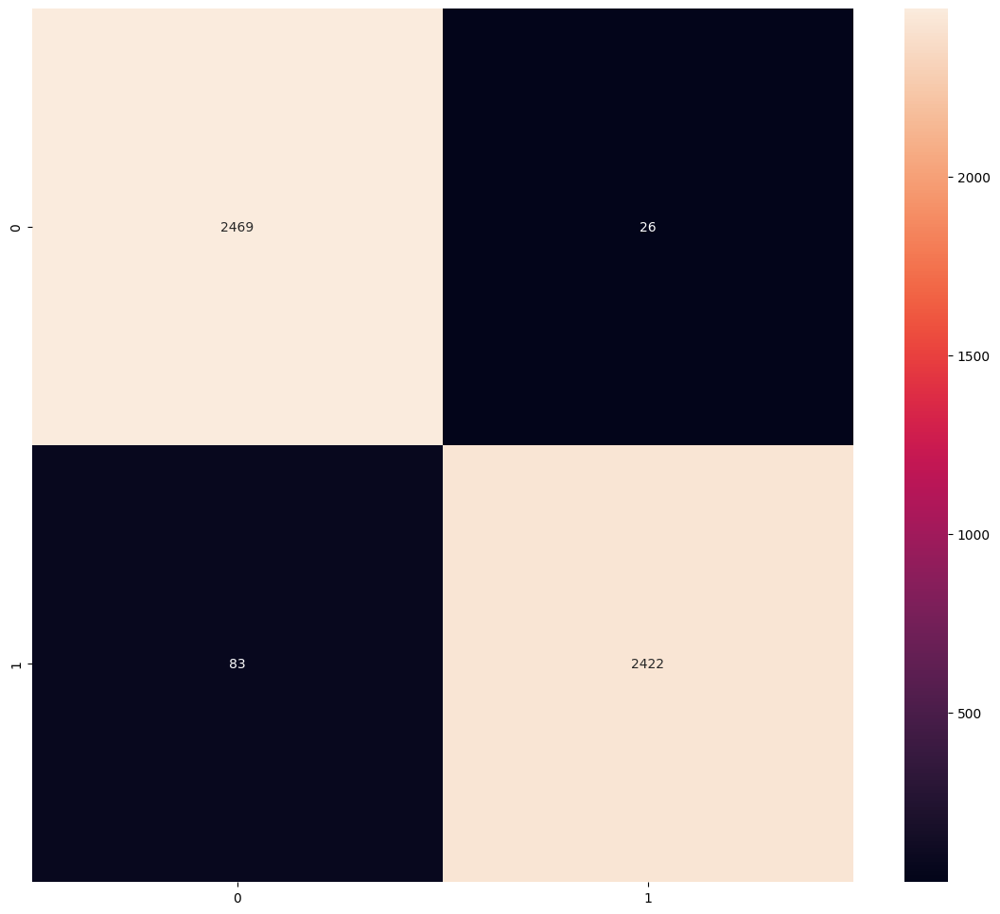

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(
    pd.DataFrame(
        confusion_matrix(true.numpy().astype("int"), predict.to('cpu').numpy().astype("int")),
    ),
    annot=True,
    fmt="d"
);

In [ ]:
total_accuracy = torch.sum(true.to(device)==predict) / true.shape[0]
print(f"Accuracy: {total_accuracy:.4f}")

Accuracy: 0.9782


In [ ]:
torch.save(resnet18_freeze.state_dict(), 'model_resnet18_freeze.pth')